# Exploratory Data Analysis of Housing Prices in Metropolian Areas of India

Authors: *Agata Kopyt* | *Zuzanna Kotlińska* | *Szymon Matuszewski* | *Patryk Słowakiewicz*

Used data: *https://www.kaggle.com/datasets/ruchi798/housing-prices-in-metropolitan-areas-of-india*

## Table of Contents:
* [**Code**](#Code)
* [**1. Overall Information**](#1.-Overall-Information)
* [**2. Bangalore Dataset**](#2.-Bangalore-Dataset)
* [2.1 Classic Overview](#2.1-Classic-Overview)
* [2.2 Correlations Check](#2.2-Correlations-Check)
* [2.3 Plots Exploring](#2.3-Plots-Exploring)
* [2.4 Comments & Conclusions](#2.4-Comments-&-Conclusions)
* [**3. Chennai Dataset**](#3.-Chennai-Dataset)
* [3.1 Classic Overview](#3.1-Classic-Overview)
* [3.2 Correlations Check](#3.2-Correlations-Check)
* [3.3 Plots Exploring](#3.3-Plots-Exploring)
* [3.4 Comments & Conclusions](#3.4-Comments-&-Conclusions)
* [**4. Delhi Dataset**](#4.-Delhi-Dataset)
* [4.1 Classic Overview](#4.1-Classic-Overview)
* [4.2 Correlations Check](#4.2-Correlations-Check)
* [4.3 Plots Exploring](#4.3-Plots-Exploring)
* [4.4 Comments & Conclusions](#4.4-Comments-&-Conclusions)
* [**5. Hyderabad Dataset**](#5.-Hyderabad-Dataset)
* [5.1 Classic Overview](#5.1-Classic-Overview)
* [5.2 Correlations Check](#5.2-Correlations-Check)
* [5.3 Plots Exploring](#5.3-Plots-Exploring)
* [5.4 Comments & Conclusions](#5.4-Comments-&-Conclusions)
* [**6. Kolkata Dataset**](#6.-Kolkata-Dataset)
* [6.1 Classic Overview](#6.1-Classic-Overview)
* [6.2 Correlations Check](#6.2-Correlations-Check)
* [6.3 Plots Exploring](#6.3-Plots-Exploring)
* [6.4 Comments & Conclusions](#6.4-Comments-&-Conclusions)
* [**7. Mumbai Dataset**](#7.-Mumbai-Dataset)
* [7.1 Classic Overview](#7.1-Classic-Overview)
* [7.2 Correlations Check](#7.2-Correlations-Check)
* [7.3 Plots Exploring](#7.3-Plots-Exploring)
* [7.4 Comments & Conclusions](#7.4-Comments-&-Conclusions)
* [**8. All in One**](#8.-All-in-One)
* [8.1 Classic Overview](#8.1-Classic-Overview)
* [8.2 Correlations Check](#8.2-Correlations-Check)
* [8.3 Plots Exploring](#8.3-Plots-Exploring)
* [8.4 Comments & Conclusions](#8.4-Comments-&-Conclusions)
* [**9. Summary**](#9.-Summary)

## Code

In [52]:
# Import libraries, read data and set seed

import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns
import pandas as pd 
import scipy as sc
import warnings as wr
import sys
np.random.seed(23)

bangalore = pd.read_csv('India/Bangalore.csv', delimiter=',')
chennai = pd.read_csv('India/Chennai.csv', delimiter=',')
delhi = pd.read_csv('India/Delhi.csv', delimiter=',')
hyderabad = pd.read_csv('India/Hyderabad.csv', delimiter=',')
kolkata = pd.read_csv('India/Kolkata.csv', delimiter=',')
mumbai = pd.read_csv('India/Mumbai.csv', delimiter=',')

In [53]:
def checkNaNs(df):
    df.replace(9, np.nan, inplace=True)
    return df.isna().sum()

In [54]:
def countUnique4Columns(df):
    
    output = []
    
    for column_name in df.columns:
        
        column = df[column_name]
        unique = len(column.unique())
    
        output.append((column_name,unique))
    
    output = pd.DataFrame(output, columns=['ColumnName','NumberOfUnique'])
    
    return output

In [55]:
# Correlations check overall
import itertools
import scipy.stats as ss
from sklearn.preprocessing import LabelEncoder
from itertools import accumulate
from pycorrcat.pycorrcat import plot_corr, corr_matrix 

def groupPriceAndArea(df,price_k,area_k):
    ## Grouping Price and Area variables
    max_price = df["Price"].max()
    max_area = df["Area"].max()
    labels_price = list(accumulate((([max_price/price_k]*price_k))))
    labels_area = list(accumulate((([max_area/area_k]*area_k))))
    bins_price = list(accumulate((([0])+([max_price/price_k]*price_k))))
    bins_area = list(accumulate((([0])+([max_area/area_k]*area_k))))
    categories_price = pd.cut(df.Price,bins=bins_price,labels=labels_price)
    categories_area = pd.cut(df.Area,bins=bins_area,labels=labels_area)
    df["PriceGroup"] = pd.to_numeric(categories_price)
    df["AreaGroup"] = pd.to_numeric(categories_area)
    
    return 

def cramers_V(var1,var2):
    
    crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
    stat = ss.chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
    obs = np.sum(crosstab) # Number of observations
    mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
    
    return (stat/(obs*mini))

def cramers_corrected_stat(confusion_matrix):
    """ calculate Cramers V statistic for categorical-categorical association.
        uses correction from Bergsma and Wicher, 
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

def corrPlot(df,price_k,area_k):
    
    ## Encoding Location variable
    le = LabelEncoder()
    df["Location"] = le.fit_transform(df["Location"])
    
    ## Grouping Price and Area variables
    groupPriceAndArea(df,price_k,area_k)
    
    ## Make corrPlot
    cols = [name for name in df.columns if pd.api.types.is_numeric_dtype(df[name])]
    
    corrM = np.zeros((len(cols),len(cols)))
    # there's probably a nice pandas way to do this
    for col1, col2 in itertools.combinations(cols, 2):
        idx1, idx2 = cols.index(col1), cols.index(col2)
        corrM[idx1, idx2] = cramers_corrected_stat(pd.crosstab(df[col1], df[col2]))
        corrM[idx2, idx1] = corrM[idx1, idx2]

    corr = pd.DataFrame(corrM, index=cols, columns=cols)
    
    df["Location"] = le.inverse_transform(df["Location"])
    
    fig, ax = plt.subplots(figsize=(20, 20))
    ax = sns.heatmap(corr, annot=True, ax=ax); ax.set_title("Cramer V Correlation between Variables");
    
    return 

In [56]:
def checkStrongCorrelations(df,corr):
    
    length = len(df.columns)
    
    output = []
    
    for i in range(2,length):
        for j in range(i+1,length):
            
            column1 = df.iloc[:,i]
            column2 = df.iloc[:,j]
            correlation = cramers_V(column1,column2)
            
            if abs(correlation) > corr:
                
                output.append((column1.name,column2.name,correlation))
                
    output = pd.DataFrame(output, columns=['Column1','Column2','Correlation'])
    
    return output

In [57]:
def strongestCorr4SpecifiedColumn(df,columnName):
    
    output = []
    
    column = df[columnName]
    
    for col in df:
        
        corr = cramers_V(column,df[col])
        output.append((col,corr))
        
    output = pd.DataFrame(output, columns=['ColumnName','Correlation'])
    output = output.sort_values(by='Correlation',key=abs,ascending=False)
    
    return output
    

In [58]:
def propertiesByLocation(df):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title('No. of Properties by Location (Top 25)', fontsize=20)
    sns.countplot(y='Location', data=df, order=df.Location.value_counts().index[:25],color="gray")
    ax.set_xlabel('No. of Properties', fontsize=15)
    ax.set_ylabel('Location', fontsize=15)
    plt.show()

In [59]:
def areaDistribution(df):
    
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title('Area Distribution', fontsize=20)
    sns.countplot(x='AreaGroup', data=df,color="gray")
    ax.set_ylabel('No of Properties', fontsize=15)
    ax.set_xlabel('Area Ranges', fontsize=15)
    plt.xticks(rotation=45)
    plt.show()

In [60]:
def priceDistribution(df):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title('Price Distribution', fontsize=20)
    sns.countplot(x='PriceGroup', data=df,color="gray")
    ax.set_ylabel('No of Properties', fontsize=15)
    ax.set_xlabel('Price Ranges', fontsize=15)
    plt.xticks(rotation=45)
    plt.show()

In [61]:
def histPriceAndArea(df):
    
    names = ["Price","Area"]
    
    df[names].hist(bins=40)
    
    return

In [62]:
def PriceAndArea(df):
    
    for column in df.iloc[:,3:40]:
        sns.relplot(data = df, x ="Area", y ="Price", hue=column)
        plt.show()

In [63]:
def box(df):
    fig, ax = plt.subplots(figsize=(15, 7))
    sns.boxplot(data = df, x ="AreaGroup", y ="Price",color="gray")
    plt.show()
    return

In [64]:
def barplotWith5MostExpensiveAreas(df):
    
    fig, ax = plt.subplots(figsize=(15, 7))
    df.groupby("Location")["Price"].mean().sort_values(ascending=False).head().plot.bar()
    
    return

## 1. Overall Information

**Content**:
This dataset comprises data that was scraped. It includes:

* collection of prices of new and resale houses located in the metropolitan areas of India
* the amenities provided for each house

The dataset consist of 6 dataframes reffering to one metropolian area in India:

* Bangalore.csv
* Chennai.csv
* Delhi.csv
* Hyderabad.csv
* Kolkata.csv
* Mumbai.csv

Each of the dataframes consists of 40 explanatory variables describing various aspects of new and resale houses in the metropolitan areas of India, one can predict the final price of houses in these regions.

**Variables and their descriptions (if needed)**:

* Price - price of the house in INR - continouos variable
* Area - area of the house in sq ft - continuous variable
* Location - categorical variable
* No. of Bedrooms
* Resale - categorical variable
* MaintenanceStaff - categorical variable
* Gymnasium - in the area - categorical varaiable
* SwimmingPool - categorical variable
* LandscapedGardens - categorical variable
* JoggingTrack - in the area - categorical variable
* RainWaterHarvesting - categorical variable
* IndoorGames - categorical variable
* ShoppingMall - in the area - categorical variable
* Intercom - a device that enables two-way communication between people and their houses - categorical variable
* SportsFacility - in the area - categorical variable
* Atm - in the area - categorical variable
* ClubHouse - categorical variable
* School - in the area - categorical variable
* 24x7Security - categorical variable
* PowerBackup - categorical variable
* CarParking - categorical variable
* StaffQuarter - categorical variable
* Cafeteria - categorical variable
* MultipurposeRoom - categorical variable
* Hospital - in the area - categorical variable
* WashingMachine - categorical variable
* Gasconnection - categorical variable
* AC - air conditioning - categorical variable
* Wifi - categorical variable
* Childern'splayarea - in the area - categorical variable
* LiftAvailable - categorical variable
* BED - beverage entertainment dining - categorical variable
* VaastuCompliant - designed to use every space and corner fruitfully - categorical variable
* Microwave - categorical variable
* GolfCourse - categorical variable
* TV - categorical variable
* DinigTable - categorical variable
* Sofa - categorical variable
* Wardrobe - categorical variable
* Refrigerator - categorical variable

**Note**:

Since for a set of houses, nothing was mentioned about certain amenities, '**9**' was used to mark such values, which could indicate the absence of information about the apartment but these values don't ascertain the absence of such a feature in real life.

## 2. Bangalore Dataset

**Bangalore**, officially known as Bengaluru, is the capital and the largest city of the Indian state of Karnataka. It has a population of more than 8 million and a metropolitan population of around 11 million, making it the third most populous city and fifth most populous urban agglomeration in India. Located in southern India on the Deccan Plateau, at a height of over 900 m (3,000 ft) above sea level, Bangalore is known for its pleasant climate throughout the year. Its elevation is the highest among the major cities of India.

## 2.1 Classic Overview

In [65]:
bangalore.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,30000000,3340,JP Nagar Phase 1,4,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
1,7888000,1045,Dasarahalli on Tumkur Road,2,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
2,4866000,1179,Kannur on Thanisandra Main Road,2,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
3,8358000,1675,Doddanekundi,3,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,6845000,1670,Kengeri,3,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0


In [66]:
bangalore.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,6.207000e+03,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,...,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000
mean,1.058510e+07,1526.094248,2.556952,0.078782,6.208797,6.461576,6.436121,6.382471,6.396649,6.373933,...,6.438537,6.211052,6.311100,6.210569,6.181569,6.210569,6.210569,6.210569,6.171097,6.210569
std,1.410943e+07,764.845609,0.694300,0.269420,4.126883,3.752421,3.792567,3.875271,3.853661,3.888204,...,3.788782,4.123761,3.981513,4.124430,4.164294,4.124430,4.124430,4.124430,4.178546,4.124430
min,2.000000e+06,415.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000e+06,1110.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.368000e+06,1340.000000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,1.070000e+07,1662.500000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,3.000000e+08,9900.000000,7.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [67]:
bangalore.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6207 entries, 0 to 6206
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                6207 non-null   int64 
 1   Area                 6207 non-null   int64 
 2   Location             6207 non-null   object
 3   No. of Bedrooms      6207 non-null   int64 
 4   Resale               6207 non-null   int64 
 5   MaintenanceStaff     6207 non-null   int64 
 6   Gymnasium            6207 non-null   int64 
 7   SwimmingPool         6207 non-null   int64 
 8   LandscapedGardens    6207 non-null   int64 
 9   JoggingTrack         6207 non-null   int64 
 10  RainWaterHarvesting  6207 non-null   int64 
 11  IndoorGames          6207 non-null   int64 
 12  ShoppingMall         6207 non-null   int64 
 13  Intercom             6207 non-null   int64 
 14  SportsFacility       6207 non-null   int64 
 15  ATM                  6207 non-null   int64 
 16  ClubHo

In [68]:
checkNaNs(bangalore)

Price                     0
Area                      0
Location                  0
No. of Bedrooms           0
Resale                    0
MaintenanceStaff       4256
Gymnasium              4256
SwimmingPool           4256
LandscapedGardens      4256
JoggingTrack           4256
RainWaterHarvesting    4256
IndoorGames            4256
ShoppingMall           4256
Intercom               4256
SportsFacility         4256
ATM                    4256
ClubHouse              4256
School                 4256
24X7Security           4256
PowerBackup            4256
CarParking             4256
StaffQuarter           4256
Cafeteria              4256
MultipurposeRoom       4256
Hospital               4256
WashingMachine         4256
Gasconnection          4256
AC                     4256
Wifi                   4256
Children'splayarea     4256
LiftAvailable          4256
BED                    4256
VaastuCompliant        4256
Microwave              4256
GolfCourse             4256
TV                  

In [69]:
countUnique4Columns(bangalore)

,ColumnName,NumberOfUnique
0,Price,2146
1,Area,1359
2,Location,302
3,No. of Bedrooms,7
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 2.2 Correlations Check

<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_

<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-55-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_

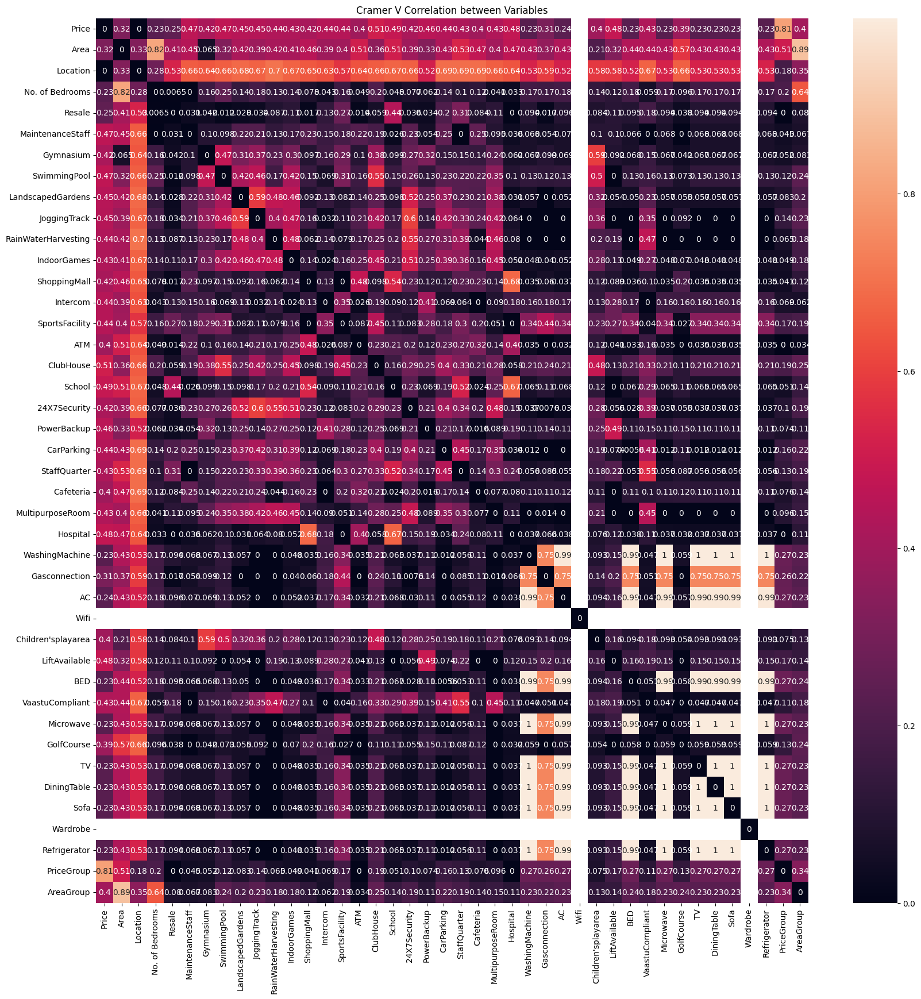

In [70]:
corrPlot(bangalore,20,20)
plt.show()

In [71]:
checkStrongCorrelations(bangalore,0.75)

<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: Runt

<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,Column1,Column2,Correlation
0,WashingMachine,AC,0.972559
1,WashingMachine,BED,0.981560
2,WashingMachine,Microwave,0.995338
3,WashingMachine,TV,0.995338
4,WashingMachine,DiningTable,0.995338
5,WashingMachine,Sofa,0.995338
6,WashingMachine,Refrigerator,0.995338
7,AC,BED,0.977135
8,AC,Microwave,0.972559
9,AC,TV,0.972559


In [72]:
strongestCorr4SpecifiedColumn(bangalore,"PriceGroup")

<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-55-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,ColumnName,Correlation
40,PriceGroup,1.000000
0,Price,1.000000
1,Area,0.474600
41,AreaGroup,0.117575
2,Location,0.080890
31,BED,0.079079
25,WashingMachine,0.077667
39,Refrigerator,0.077667
37,Sofa,0.077667
36,DiningTable,0.077667


## 2.3 Plots Exploring

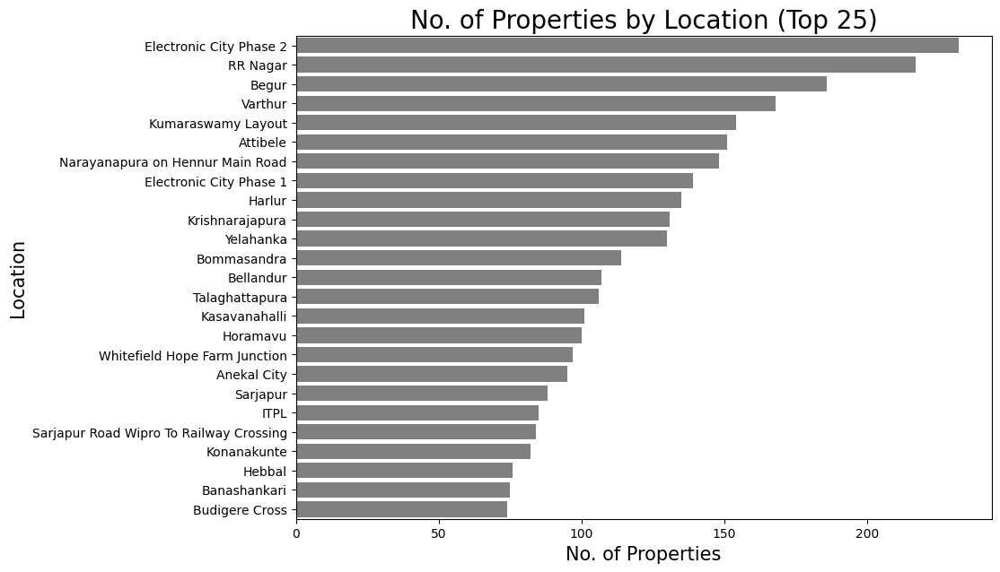

In [73]:
propertiesByLocation(bangalore)

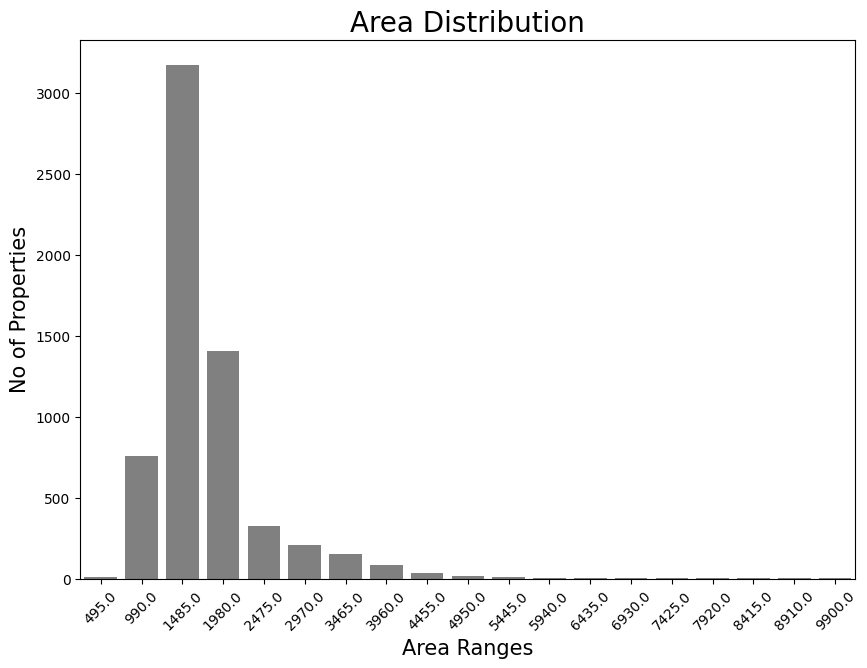

In [74]:
areaDistribution(bangalore)

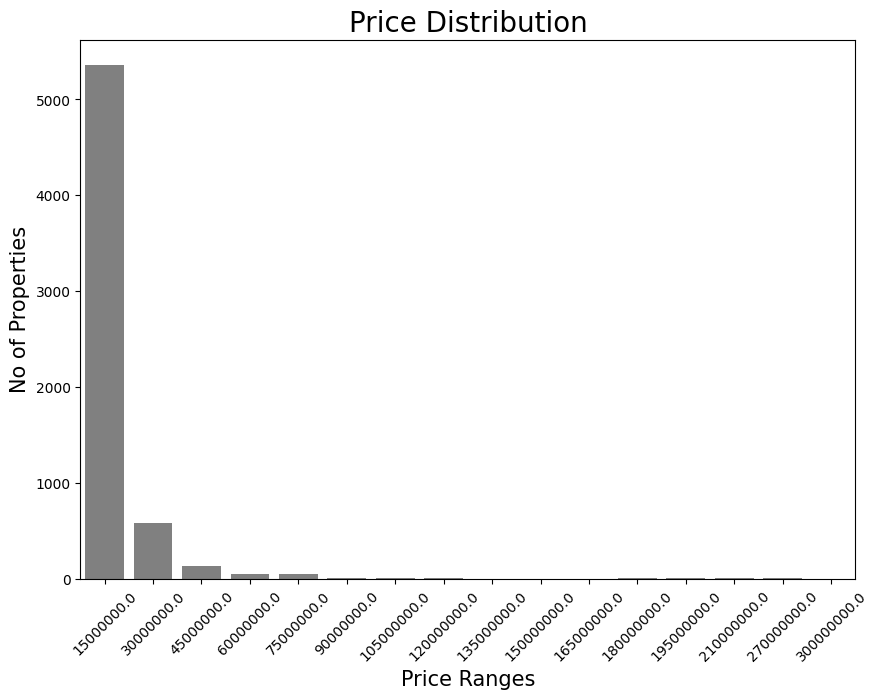

In [75]:
priceDistribution(bangalore)

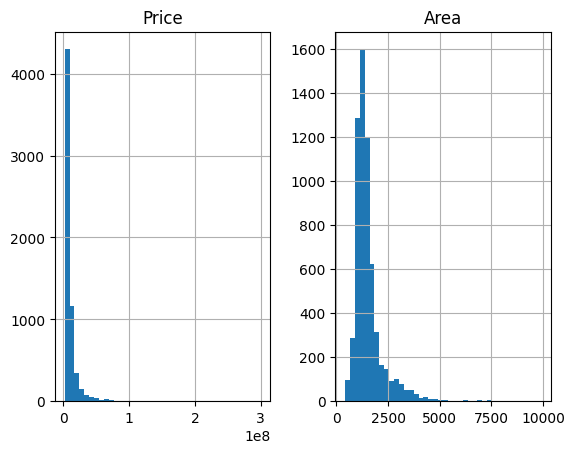

In [78]:
histPriceAndArea(bangalore)
plt.show()

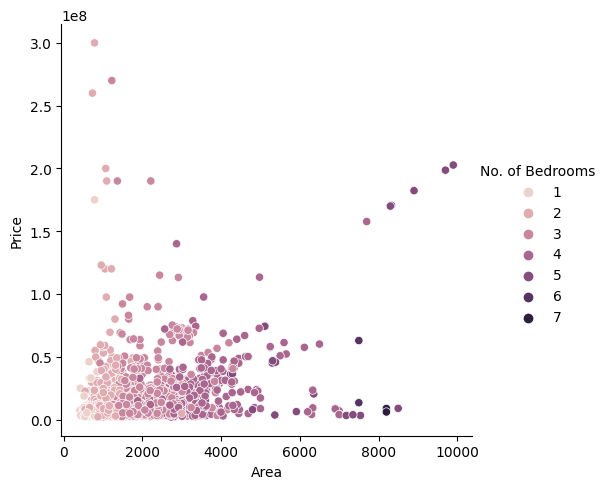

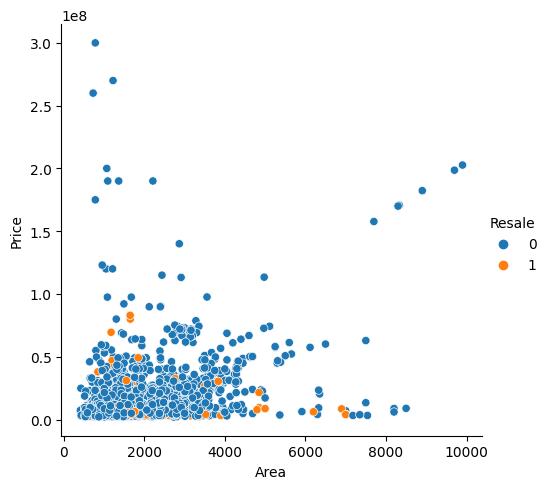

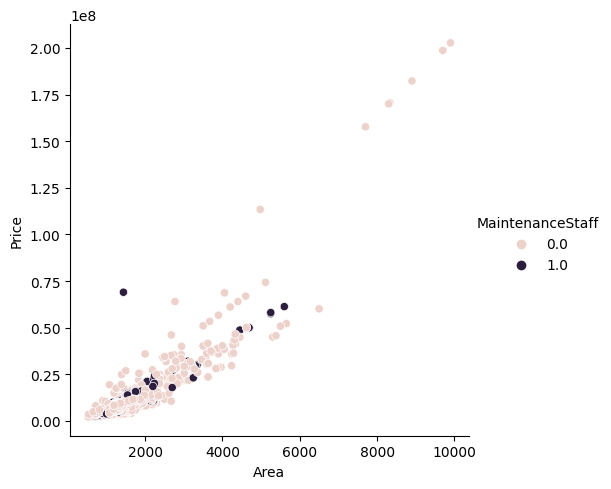

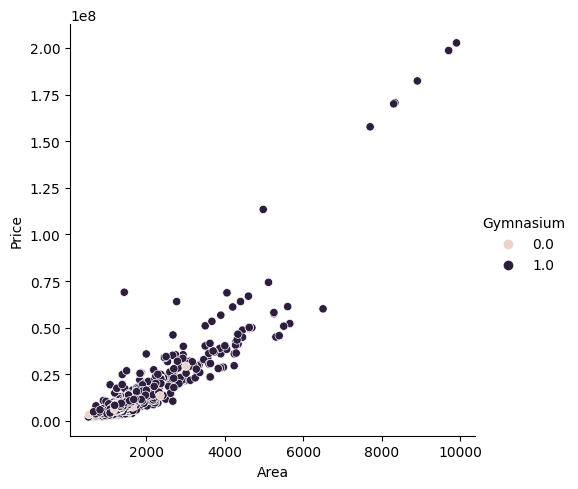

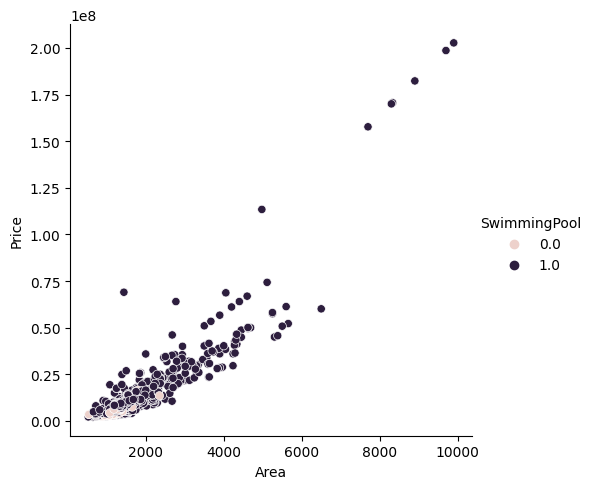

...

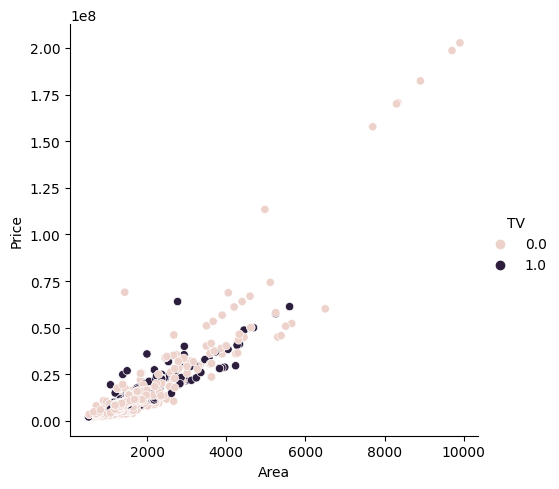

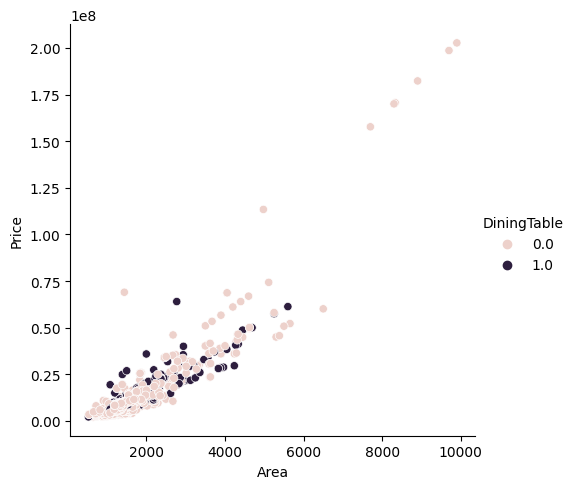

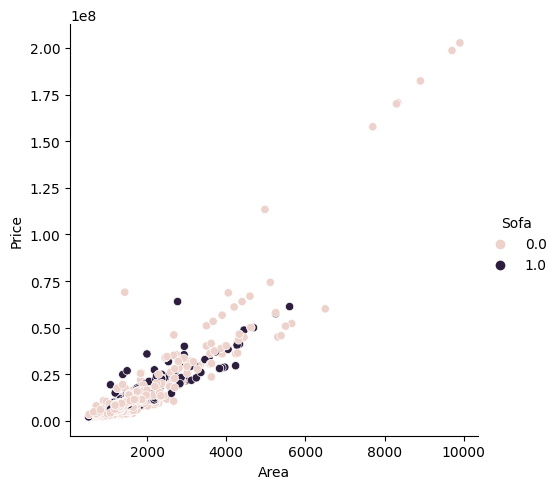

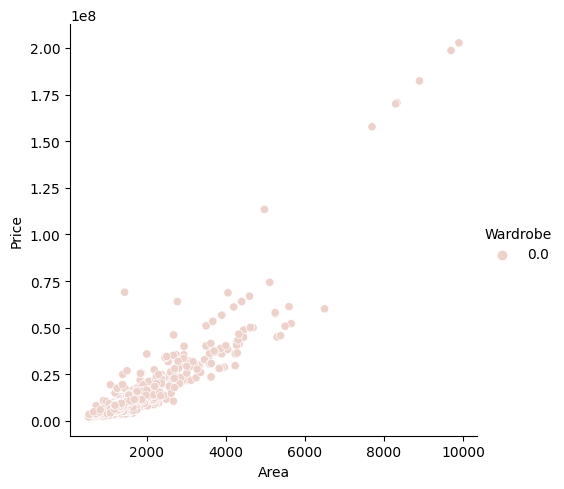

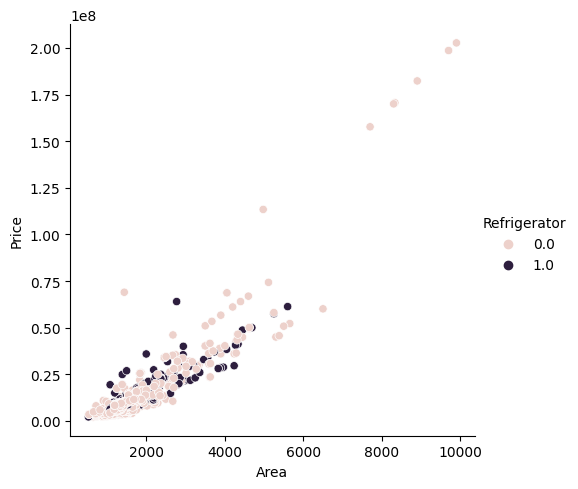

In [79]:
PriceAndArea(bangalore)

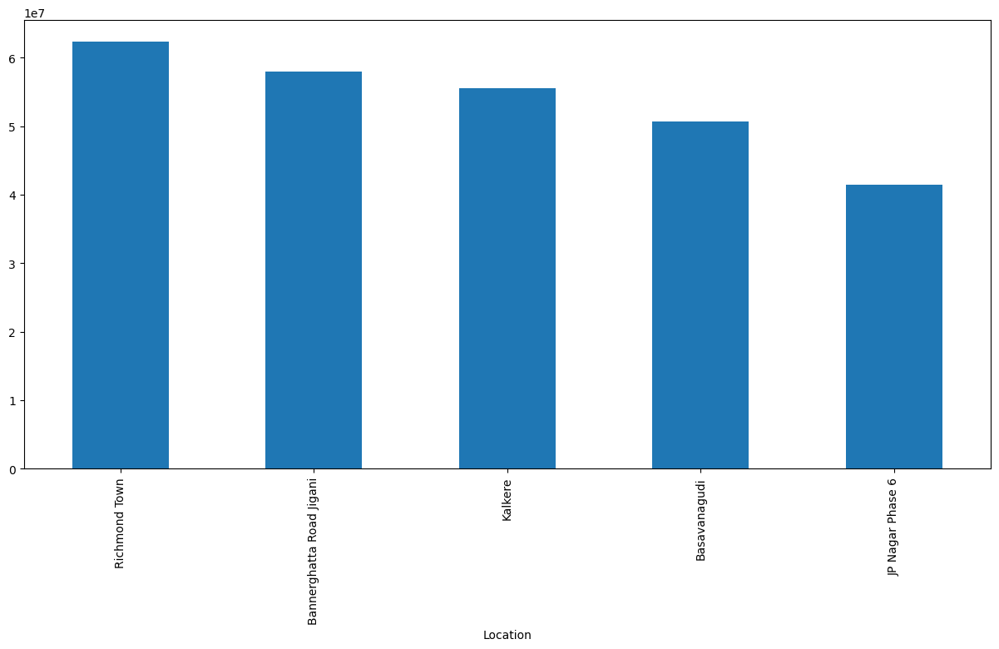

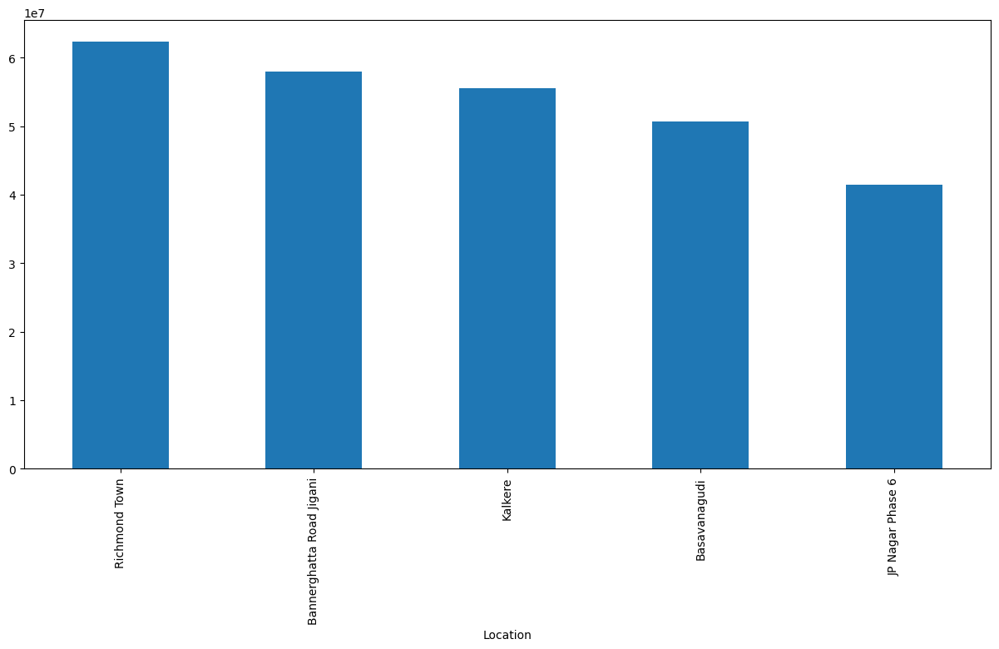

In [81]:
barplotWith5MostExpensiveAreas(bangalore)
plt.show()

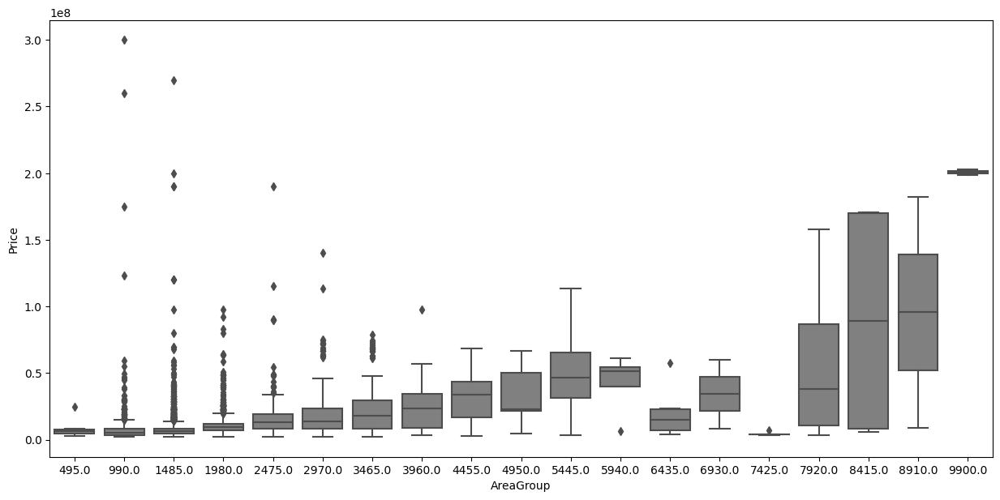

In [82]:
box(bangalore)
plt.show()

## 2.4 Comments & Conclusions

To sum up, Bangalore dataset consists of 6207 rows and 40 columns. It has no null values at first glance but our `checkNaNs` function has revealed that apart from columns such as *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale* there are 4256 NaN values (marked as '9') for every other variable. Most of our variables are discrete type, so there are not many unique values but as you can see above the situation is different for continuous variables such as *Price*, *Area* and *Location* which have 2146, 1359 and 302 unique records (quite a lot). We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. These can potentially be *BED*, *WashingMachine* or *AC* (with correlation value over 0.99). It is also important to check how the correlation value looks for *PriceGroup*. Of course it is no surprise that it is strongly associated with *Price* but we wanted to see how it correlates with other variables. Above, we can notice that there is some correlation with *Area* but it is not that strong (approx 0.47). Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Bangalore are *Electronic City Phase 2*, *RR Nagar* and *Begur* with over 150 properties located in each of them.
2. The most common size of the property is 1445 sq feet (approx 133 sq metres). Properties over 3960 sq feet (huge - 365 sq metres) and below 500 sq feet are rare to find.
3. The majority of houses costs less than 15000000.0 INR (178k EUR).
4. It goes without saying that the bigger the area, the higher the price and number of bedrooms. Surprisingly, there happen to be properties with big footage and the highest number of bedrooms that cost less than average. On the other hand, there are also expensive, small houses with one or two bedrooms.
5. Properties located close to sports facilities, gymnasium or jogging track tend to be more expensive. There are not many properties near school or shopping mall but if there are any, they are usually smaller (which implies lower price).
6. Bangalore's most expensive areas are *Richmond Town*, *Bannerghatta Road Jigani* and *Kalkere* with average property prices higher than 55000000.0 INR (653k EUR).


## 3. Chennai Dataset

**Chennai** is the capital city of the Indian state of Tamil Nadu. The state's largest city in area and population as well, Chennai is located on the Coromandel Coast of the Bay of Bengal, and is the most prominent cultural, economic and educational centre of South India. In 2015 Chennai was named the "hottest" city (city worth visiting and worth living in for long term) by the BBC, citing the mixture of both modern and traditional values.

## 3.1 Classic Overview

In [83]:
chennai.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,5500000,1310,Perungalathur,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5350000,1126,Madhavaram,2,0,0,1,1,1,0,...,1,0,0,0,0,0,0,0,0,0
2,8205000,1307,Karapakkam,3,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
3,23400000,3600,Thiruvidandhai,3,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,10100000,1700,Iyappanthangal,3,0,0,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0


In [84]:
chennai.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,5.014000e+03,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,...,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000,5014.000000
mean,8.731264e+06,1232.992022,2.362984,0.097128,5.000997,5.213602,5.160949,5.114878,5.123055,5.115277,...,5.264260,4.999402,5.068010,4.997208,4.991823,5.009174,5.011767,4.998404,4.991823,5.009174
std,1.034261e+07,641.841841,0.705252,0.296162,4.464256,4.239118,4.296954,4.346406,4.337706,4.345983,...,4.182092,4.465864,4.395648,4.468074,4.473489,4.455995,4.453369,4.466869,4.473489,4.455995
min,2.000000e+06,362.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.095000e+06,865.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.782000e+06,1067.000000,2.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,8.675000e+06,1438.750000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,1.900000e+08,7240.000000,5.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [85]:
chennai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5014 entries, 0 to 5013
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                5014 non-null   int64 
 1   Area                 5014 non-null   int64 
 2   Location             5014 non-null   object
 3   No. of Bedrooms      5014 non-null   int64 
 4   Resale               5014 non-null   int64 
 5   MaintenanceStaff     5014 non-null   int64 
 6   Gymnasium            5014 non-null   int64 
 7   SwimmingPool         5014 non-null   int64 
 8   LandscapedGardens    5014 non-null   int64 
 9   JoggingTrack         5014 non-null   int64 
 10  RainWaterHarvesting  5014 non-null   int64 
 11  IndoorGames          5014 non-null   int64 
 12  ShoppingMall         5014 non-null   int64 
 13  Intercom             5014 non-null   int64 
 14  SportsFacility       5014 non-null   int64 
 15  ATM                  5014 non-null   int64 
 16  ClubHo

In [86]:
checkNaNs(chennai)

Price                     0
Area                      0
Location                  0
No. of Bedrooms           0
Resale                    0
MaintenanceStaff       2781
Gymnasium              2781
SwimmingPool           2781
LandscapedGardens      2781
JoggingTrack           2781
RainWaterHarvesting    2781
IndoorGames            2781
ShoppingMall           2781
Intercom               2781
SportsFacility         2781
ATM                    2781
ClubHouse              2781
School                 2781
24X7Security           2781
PowerBackup            2781
CarParking             2781
StaffQuarter           2781
Cafeteria              2781
MultipurposeRoom       2781
Hospital               2781
WashingMachine         2781
Gasconnection          2781
AC                     2781
Wifi                   2781
Children'splayarea     2781
LiftAvailable          2781
BED                    2781
VaastuCompliant        2781
Microwave              2781
GolfCourse             2781
TV                  

In [87]:
countUnique4Columns(chennai)

,ColumnName,NumberOfUnique
0,Price,2058
1,Area,1217
2,Location,185
3,No. of Bedrooms,5
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 3.2 Correlations Check

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

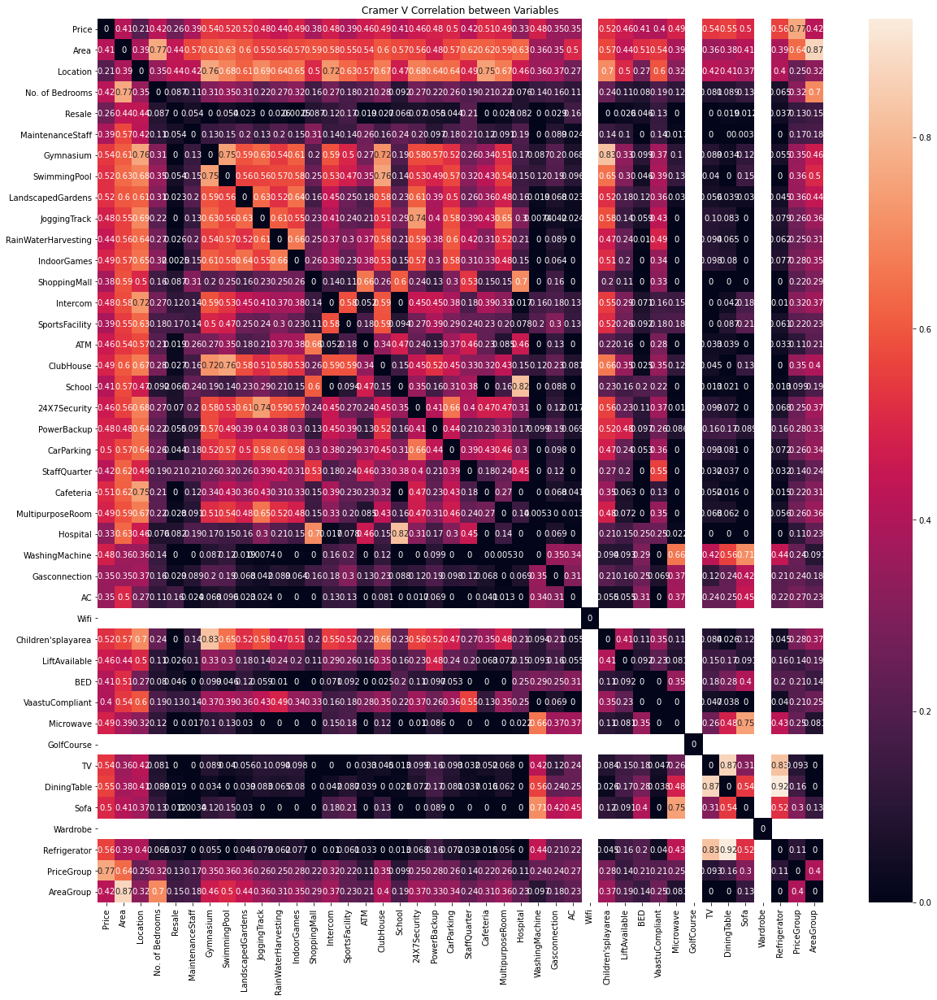

In [34]:
corrPlot(chennai,20,20)

In [35]:
checkStrongCorrelations(chennai,0.75)

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarnin

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarnin

,Column1,Column2,Correlation
0,TV,DiningTable,0.754058
1,DiningTable,Refrigerator,0.854356


In [36]:
strongestCorr4SpecifiedColumn(chennai,"PriceGroup")

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,ColumnName,Correlation
40,PriceGroup,1.000000
0,Price,1.000000
1,Area,0.474600
41,AreaGroup,0.117575
2,Location,0.080890
31,BED,0.079079
25,WashingMachine,0.077667
39,Refrigerator,0.077667
37,Sofa,0.077667
36,DiningTable,0.077667


## 3.3 Plots Exploring

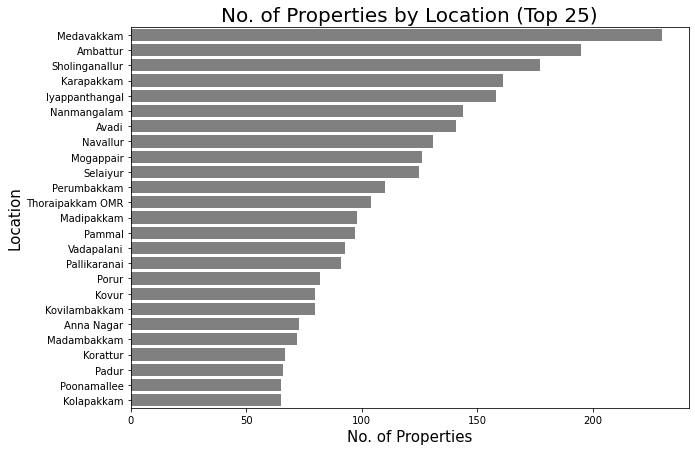

In [37]:
propertiesByLocation(chennai)

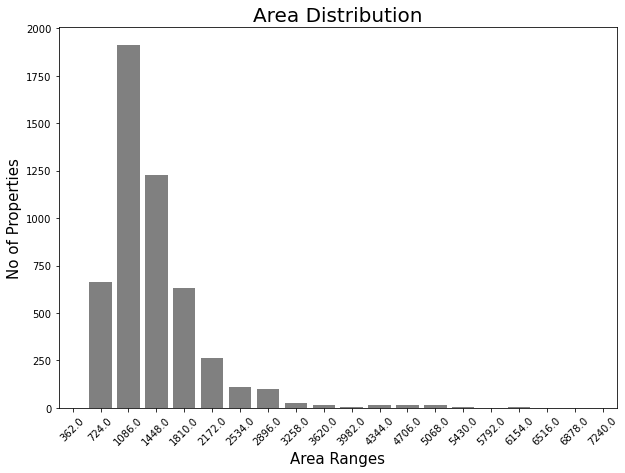

In [38]:
areaDistribution(chennai)

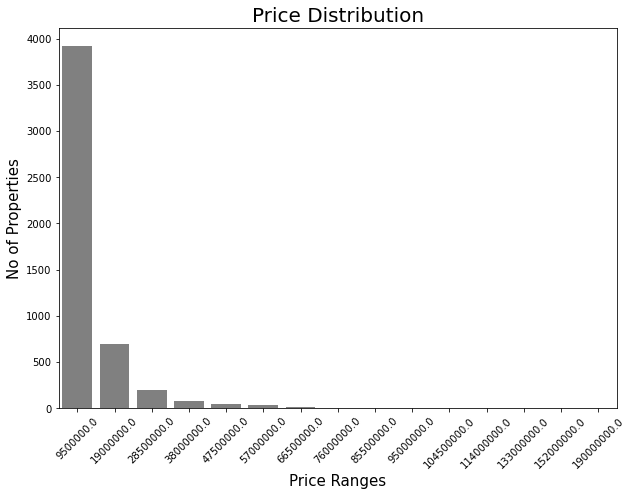

In [39]:
priceDistribution(chennai)

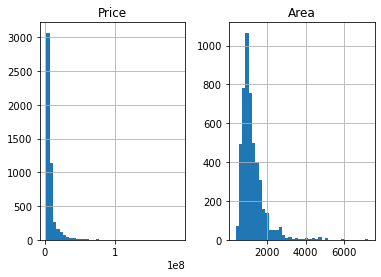

In [40]:
histPriceAndArea(chennai)

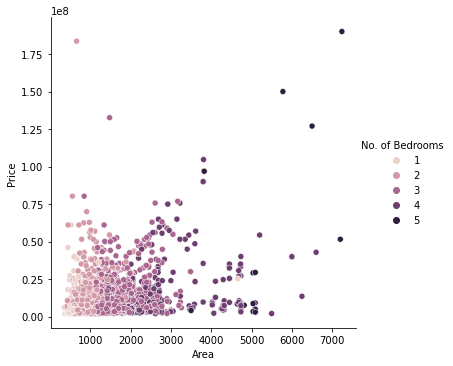

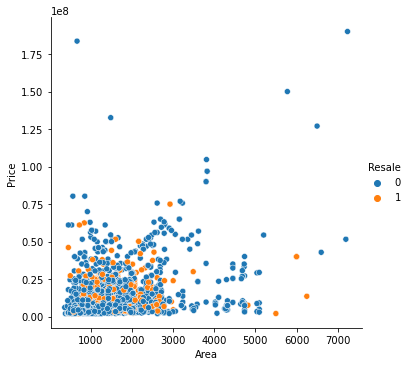

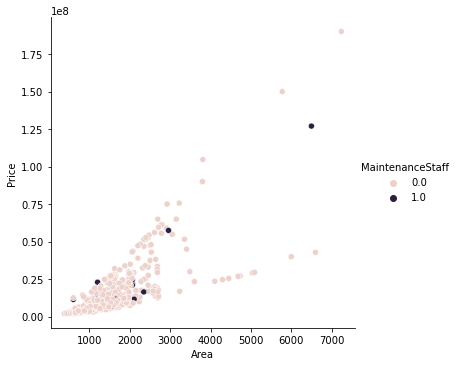

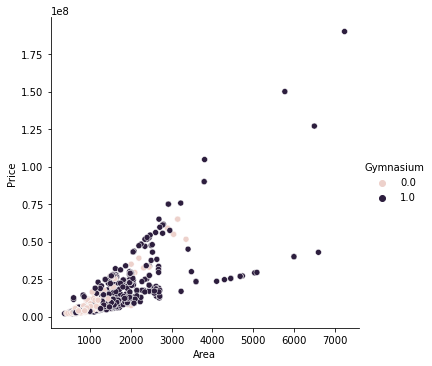

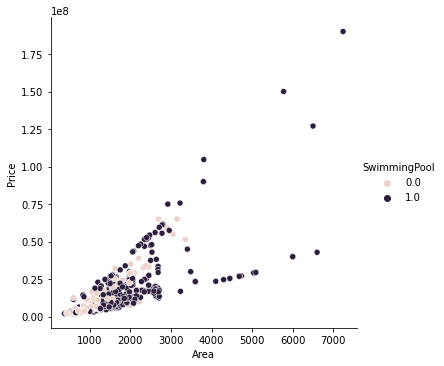

...

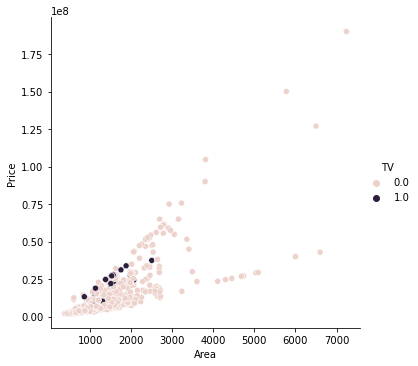

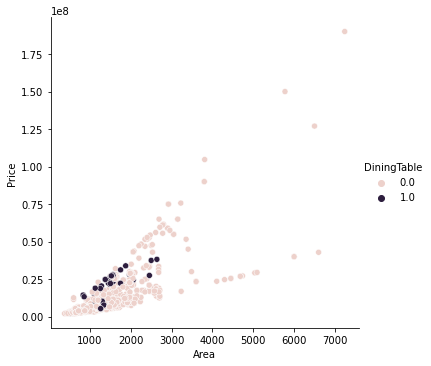

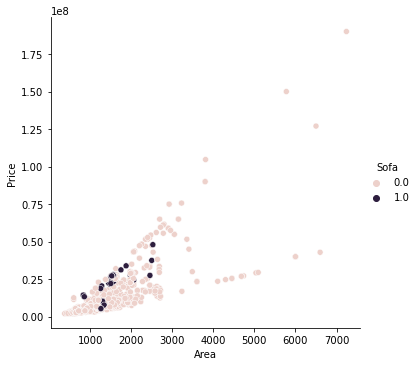

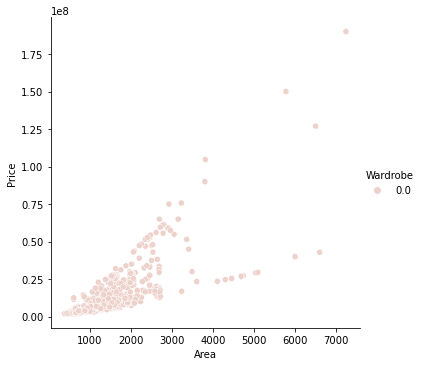

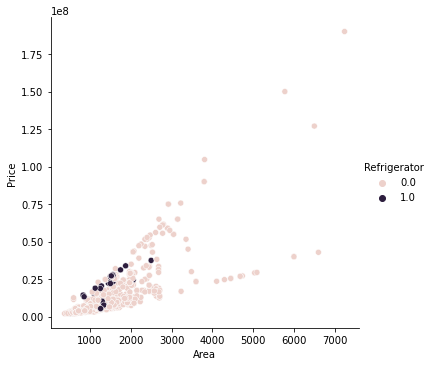

In [41]:
PriceAndArea(chennai)

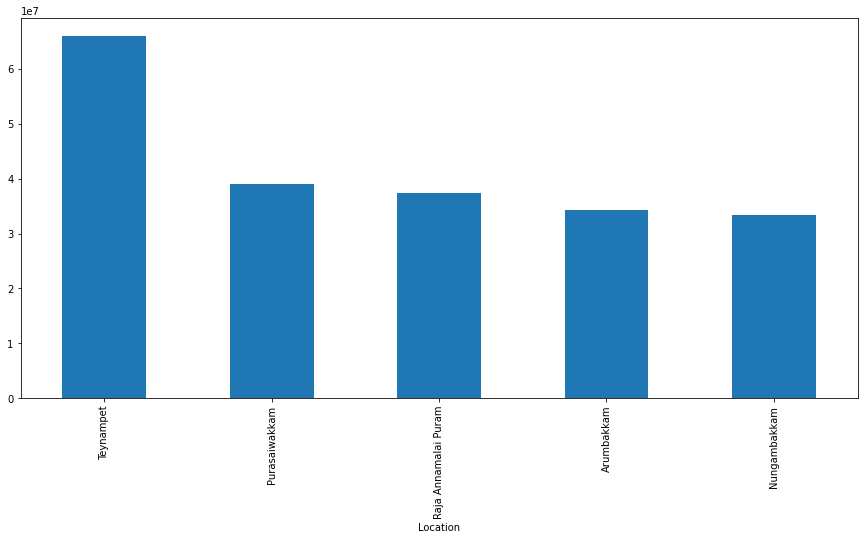

In [42]:
barplotWith5MostExpensiveAreas(chennai)

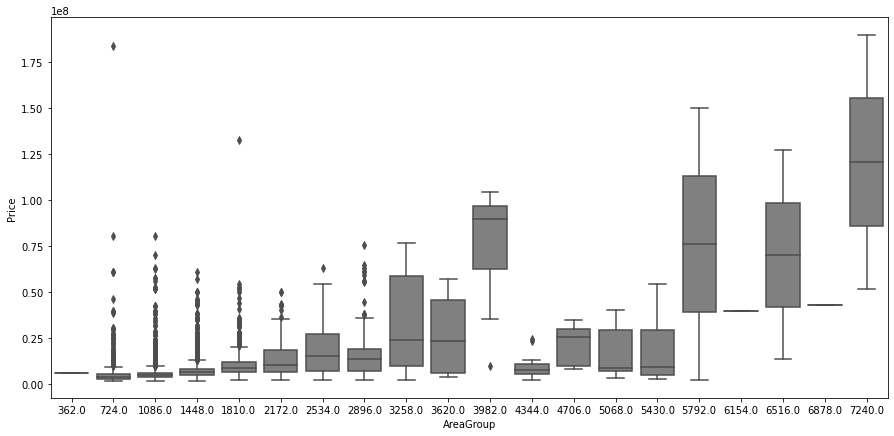

In [43]:
box(chennai)

## 3.4 Comments & Conclusions

To sum up, Chennai dataset consists of 5014 rows and 40 columns. Just like in Bangalore dataset, apart from columns such as *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale* there are 2781 NaN values (marked as '9') for every other variable. For continuous variables such as *Price*, *Area* and *Location* there are 2058, 1217 and 185 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. The potential candidate is variable *DiningTable*. Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup*. Above, we can notice that there is a pretty high (0.64) correlation with *Area* but it is not strong enough to make one of the associated columns redundant. Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Chennai are *Medavakkam*, *Ambattur* and *Sholinganallur* with over 150 properties located in each of them.
2. The most common size of the property is 1086 sq feet (approx 100 sq metres).
3. The majority of houses costs less than 9500000.0 INR (113k EUR).
4. Most of the properties are not from resale. The most expensive ones are new-built.
5. There are not many properties near school or shopping mall but if there are any, they are usually smaller (which implies lower price).
6. Chennai's most expensive area is *Teynampet* with average property prices higher than 60000000.0 INR (715k EUR).

## 4. Delhi Dataset

Dehli, officially the National Capital Territory (NCT) of Delhi, is a city and a union territory of India containing New Delhi, the capital of India. Delhi's urban agglomeration, which includes the satellite cities of Ghaziabad, Faridabad, Gurgaon and Noida in an area known as the National Capital Region (NCR), has an estimated population of over 28 million, making it the largest metropolitan area in India and the second-largest in the world (after Tokyo). Delhi is home to the second highest number of billionaires and millionaires of any city in India and has the second-highest GDP per capita in India.

## 4.1 Classic Overview

In [44]:
delhi.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,10500000,1200,Sector 10 Dwarka,2,1,0,1,0,0,1,...,1,0,1,0,0,0,0,0,0,0
1,6000000,1000,Uttam Nagar,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,15000000,1350,Sarita Vihar,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2500000,435,Uttam Nagar,2,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,5800000,900,Dwarka Mor,3,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [45]:
delhi.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,4.998000e+03,4998.000000,4998.000000,4998.00000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,...,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000,4998.000000
mean,1.588638e+07,1277.343737,2.657863,0.80012,5.423770,5.472589,5.415966,5.435574,5.412765,5.437975,...,5.655662,5.416367,5.456783,5.413165,5.394958,5.415566,5.408764,5.412965,5.394958,5.411565
std,4.612894e+07,915.217800,0.820605,0.39995,4.378355,4.322819,4.387116,4.365041,4.390702,4.362324,...,4.102704,4.386668,4.340938,4.390254,4.410549,4.387565,4.395176,4.390478,4.410549,4.392045
min,2.000000e+06,200.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.900000e+06,800.000000,2.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.500000e+06,1000.000000,3.000000,1.00000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,1.580000e+07,1650.000000,3.000000,1.00000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,8.546000e+08,16000.000000,8.000000,1.00000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [46]:
delhi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                4998 non-null   int64 
 1   Area                 4998 non-null   int64 
 2   Location             4998 non-null   object
 3   No. of Bedrooms      4998 non-null   int64 
 4   Resale               4998 non-null   int64 
 5   MaintenanceStaff     4998 non-null   int64 
 6   Gymnasium            4998 non-null   int64 
 7   SwimmingPool         4998 non-null   int64 
 8   LandscapedGardens    4998 non-null   int64 
 9   JoggingTrack         4998 non-null   int64 
 10  RainWaterHarvesting  4998 non-null   int64 
 11  IndoorGames          4998 non-null   int64 
 12  ShoppingMall         4998 non-null   int64 
 13  Intercom             4998 non-null   int64 
 14  SportsFacility       4998 non-null   int64 
 15  ATM                  4998 non-null   int64 
 16  ClubHo

In [47]:
checkNaNs(delhi)

Price                     0
Area                      0
Location                  0
No. of Bedrooms           0
Resale                    0
MaintenanceStaff       2996
Gymnasium              2996
SwimmingPool           2996
LandscapedGardens      2996
JoggingTrack           2996
RainWaterHarvesting    2996
IndoorGames            2996
ShoppingMall           2996
Intercom               2996
SportsFacility         2996
ATM                    2996
ClubHouse              2996
School                 2996
24X7Security           2996
PowerBackup            2996
CarParking             2996
StaffQuarter           2996
Cafeteria              2996
MultipurposeRoom       2996
Hospital               2996
WashingMachine         2996
Gasconnection          2996
AC                     2996
Wifi                   2996
Children'splayarea     2996
LiftAvailable          2996
BED                    2996
VaastuCompliant        2996
Microwave              2996
GolfCourse             2996
TV                  

In [48]:
countUnique4Columns(delhi)

,ColumnName,NumberOfUnique
0,Price,724
1,Area,454
2,Location,339
3,No. of Bedrooms,8
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 4.2 Correlations Check

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))


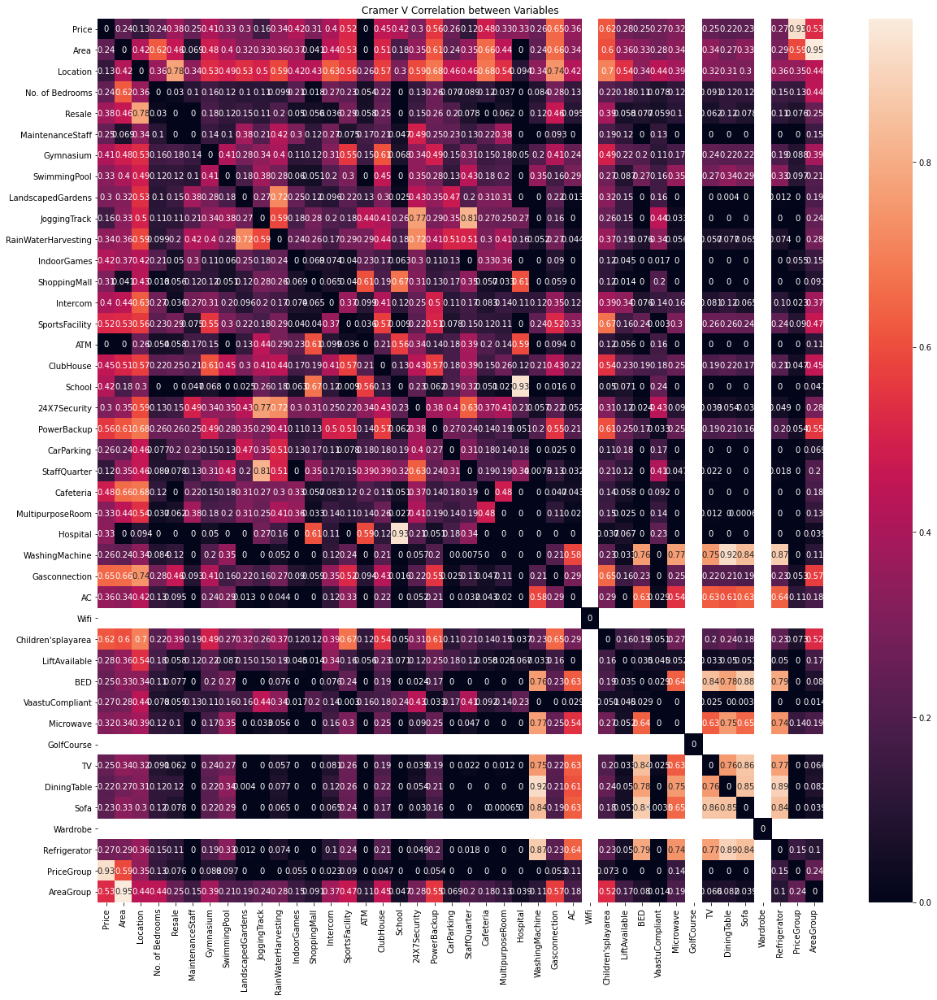

In [49]:
corrPlot(delhi,20,20)

In [50]:
checkStrongCorrelations(delhi,0.75)

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarnin

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarnin

,Column1,Column2,Correlation
0,School,Hospital,0.868712
1,WashingMachine,DiningTable,0.839753
2,WashingMachine,Refrigerator,0.763595
3,BED,Sofa,0.766550
4,DiningTable,Refrigerator,0.788294


In [51]:
strongestCorr4SpecifiedColumn(delhi,"PriceGroup")

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,ColumnName,Correlation
0,Price,1.000000
40,PriceGroup,1.000000
1,Area,0.439296
2,Location,0.191323
41,AreaGroup,0.060500
39,Refrigerator,0.023494
33,Microwave,0.021297
3,No. of Bedrooms,0.020154
27,AC,0.014374
7,SwimmingPool,0.010956


## 4.3 Plots Exploring

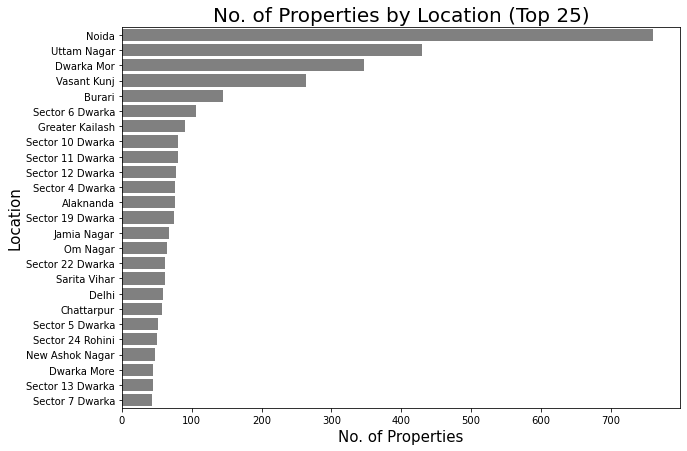

In [52]:
propertiesByLocation(delhi)

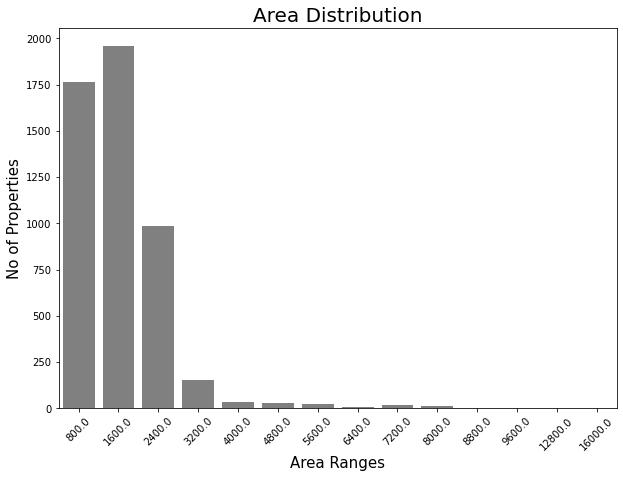

In [53]:
areaDistribution(delhi)

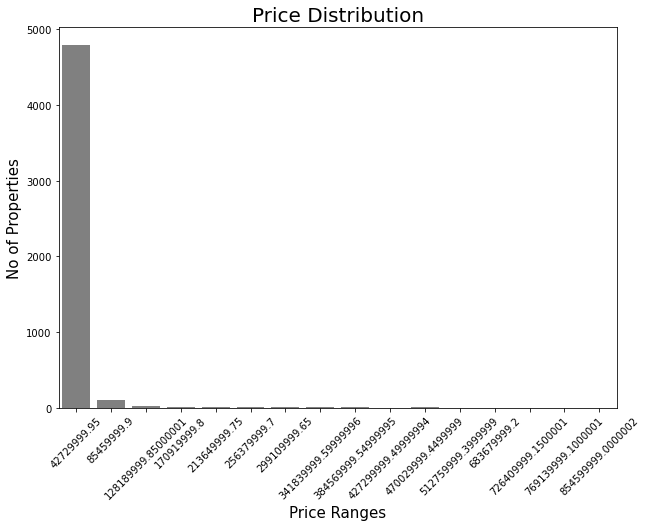

In [54]:
priceDistribution(delhi)

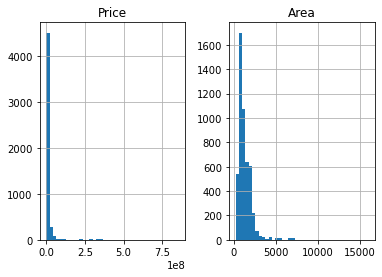

In [55]:
histPriceAndArea(delhi)

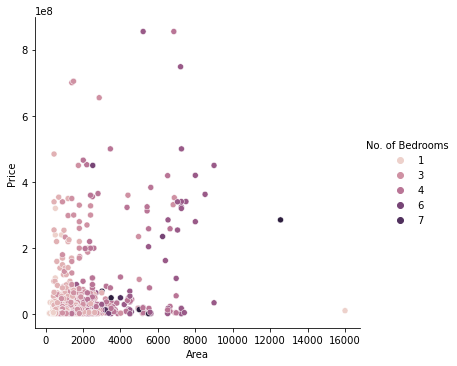

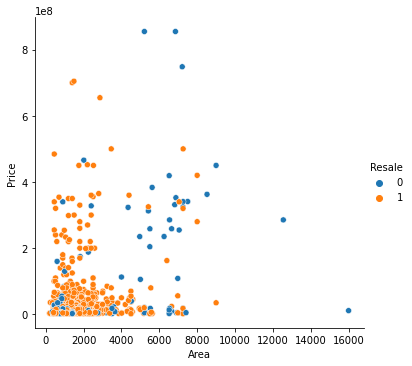

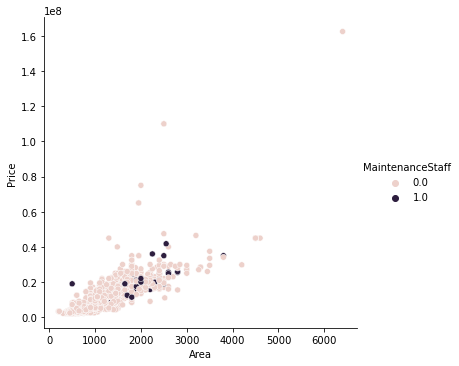

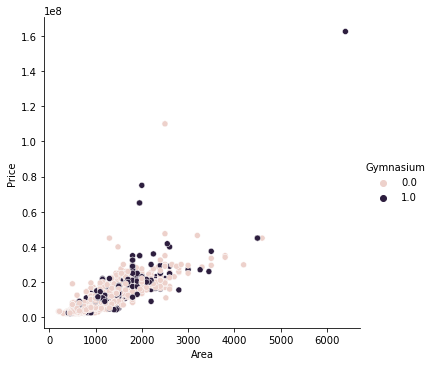

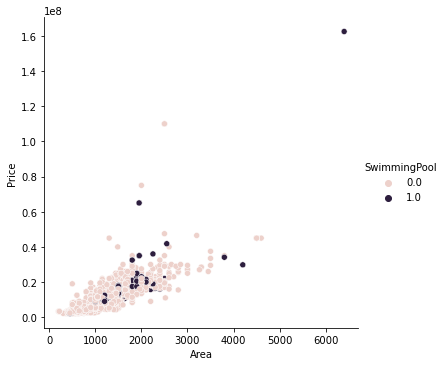

...

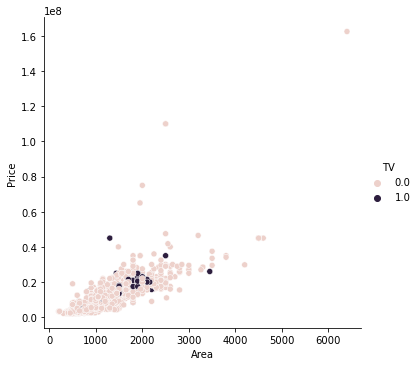

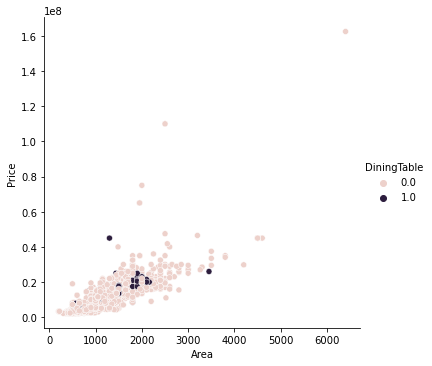

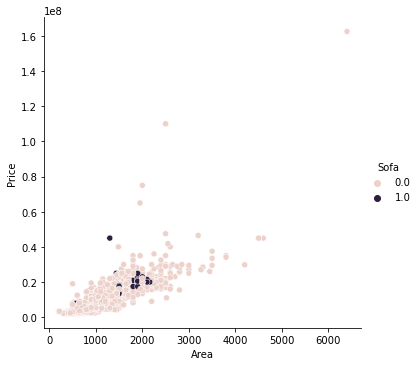

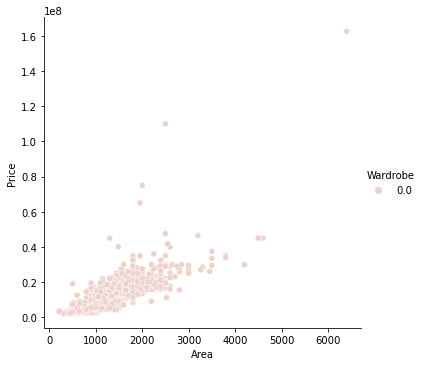

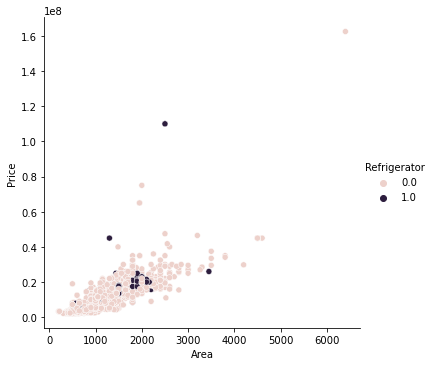

In [56]:
PriceAndArea(delhi)

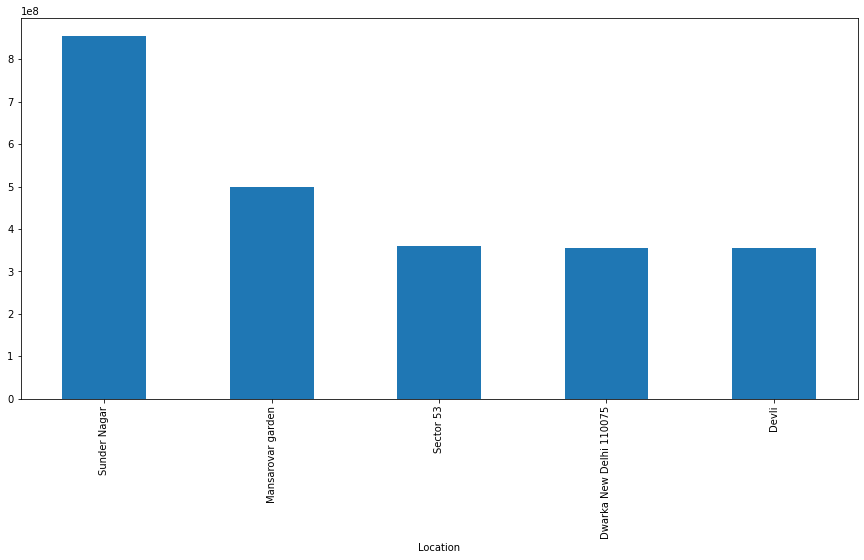

In [57]:
barplotWith5MostExpensiveAreas(delhi)

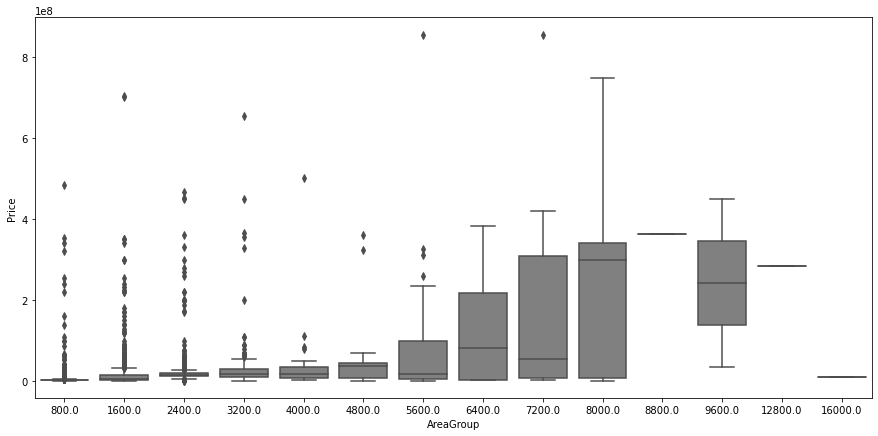

In [58]:
box(delhi)

## 4.4 Comments & Conclusions

Delhi dataset consists of 4998 rows and 40 columns. There are 2996 NaN values (marked as '9') for every column apart from *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale*. For continuous variables such as *Price*, *Area* and *Location* there are 724, 454 and 339 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. The potential candidates are variables such as *DiningTable* or *Washing machine*. Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup*. Above, we can notice that there is some correlation with *Area* but it is not that strong (approx 0.44). Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Delhi are *Noida* (over 700 properties), *Uttam Nagar* and *Dwarka Mor* (both over 350 properties).
2. The most common size of the property is 1600 sq feet (approx 147 sq metres).Two times smaller properties are also popular. 
3. The majority of houses costs less than 42700000.0 INR (509k EUR).
4. Unlike in Chennai and Bangalore, most of the properties are from resale. The biggest ones are new-built.
5. Most of the properties have 1-3 bedrooms, but there happen to be even 7 bedroom houses.
6. Delhi's most expensive area is *Sunder Nagar* with average property prices higher than 80000000.0 INR (nearly 1M EUR!).

## 5. Hyderabad Dataset

Hyderabad is the capital and largest city of the Indian state of Telangana. It occupies 650 km2 (250 sq mi) on the Deccan Plateau along the banks of the Musi River, in the northern part of South India. Hyderabad is the fourth-most populous city in India with a population of 6.9 million residents within the city limits, and has a population of 9.7 million residents in the metropolitan region, making it the sixth-most populous metropolitan area in India.

## 5.1 Classic Overview

In [59]:
hyderabad.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,6968000,1340,Nizampet,2,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
1,29000000,3498,Hitech City,4,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
2,6590000,1318,Manikonda,2,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5739000,1295,Alwal,3,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,5679000,1145,Kukatpally,2,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0


In [60]:
hyderabad.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,2.518000e+03,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,...,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000,2518.000000
mean,9.818380e+06,1644.571088,2.623511,0.227562,0.412629,0.739873,0.709690,0.619142,0.559968,0.606434,...,0.975774,0.360207,0.607228,0.342732,0.330024,0.321287,0.334392,0.342335,0.341144,0.324861
std,8.777113e+06,746.256956,0.687330,0.419341,1.626445,1.611024,1.615231,1.624426,1.627686,1.625308,...,1.557725,1.622778,1.625256,1.621178,1.619894,1.618953,1.620347,1.621139,1.621023,1.619344
min,2.000000e+06,500.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.760000e+06,1160.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.754000e+06,1500.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.090000e+07,1829.000000,3.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.650000e+08,9400.000000,8.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [61]:
hyderabad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2518 entries, 0 to 2517
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                2518 non-null   int64 
 1   Area                 2518 non-null   int64 
 2   Location             2518 non-null   object
 3   No. of Bedrooms      2518 non-null   int64 
 4   Resale               2518 non-null   int64 
 5   MaintenanceStaff     2518 non-null   int64 
 6   Gymnasium            2518 non-null   int64 
 7   SwimmingPool         2518 non-null   int64 
 8   LandscapedGardens    2518 non-null   int64 
 9   JoggingTrack         2518 non-null   int64 
 10  RainWaterHarvesting  2518 non-null   int64 
 11  IndoorGames          2518 non-null   int64 
 12  ShoppingMall         2518 non-null   int64 
 13  Intercom             2518 non-null   int64 
 14  SportsFacility       2518 non-null   int64 
 15  ATM                  2518 non-null   int64 
 16  ClubHo

In [62]:
checkNaNs(hyderabad)

Price                   0
Area                    0
Location                0
No. of Bedrooms         0
Resale                  0
MaintenanceStaff       84
Gymnasium              84
SwimmingPool           84
LandscapedGardens      84
JoggingTrack           84
RainWaterHarvesting    84
IndoorGames            84
ShoppingMall           84
Intercom               84
SportsFacility         84
ATM                    84
ClubHouse              84
School                 84
24X7Security           84
PowerBackup            84
CarParking             84
StaffQuarter           84
Cafeteria              84
MultipurposeRoom       84
Hospital               84
WashingMachine         84
Gasconnection          84
AC                     84
Wifi                   84
Children'splayarea     84
LiftAvailable          84
BED                    84
VaastuCompliant        84
Microwave              84
GolfCourse             84
TV                     84
DiningTable            84
Sofa                   84
Wardrobe    

In [63]:
countUnique4Columns(hyderabad)

,ColumnName,NumberOfUnique
0,Price,690
1,Area,579
2,Location,243
3,No. of Bedrooms,7
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 5.2 Correlations Check

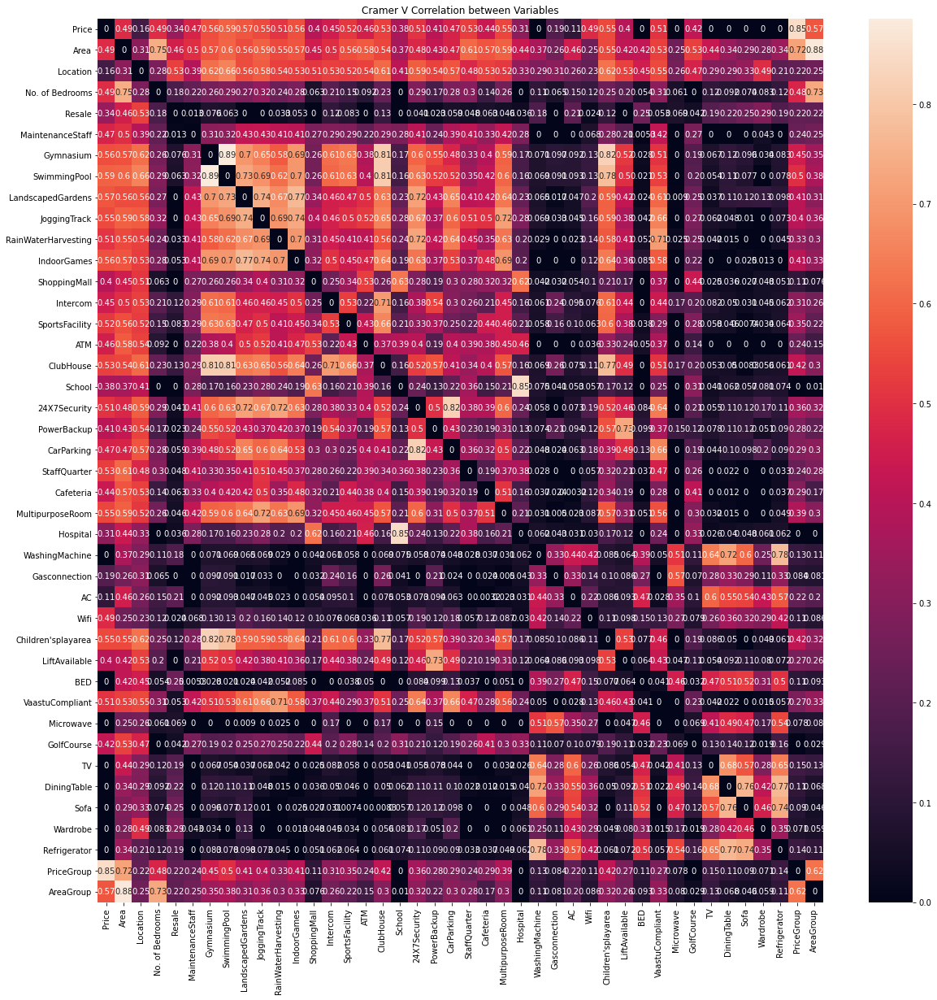

In [64]:
corrPlot(hyderabad,20,20)

In [65]:
checkStrongCorrelations(hyderabad,0.75)

,Column1,Column2,Correlation
0,Gymnasium,SwimmingPool,0.78493


In [66]:
strongestCorr4SpecifiedColumn(hyderabad,"PriceGroup")

,ColumnName,Correlation
40,PriceGroup,1.000000
0,Price,1.000000
1,Area,0.747758
41,AreaGroup,0.393765
7,SwimmingPool,0.249938
3,No. of Bedrooms,0.229314
6,Gymnasium,0.210247
16,ClubHouse,0.181449
29,Children'splayarea,0.177120
11,IndoorGames,0.169810


## 5.3 Plots Exploring

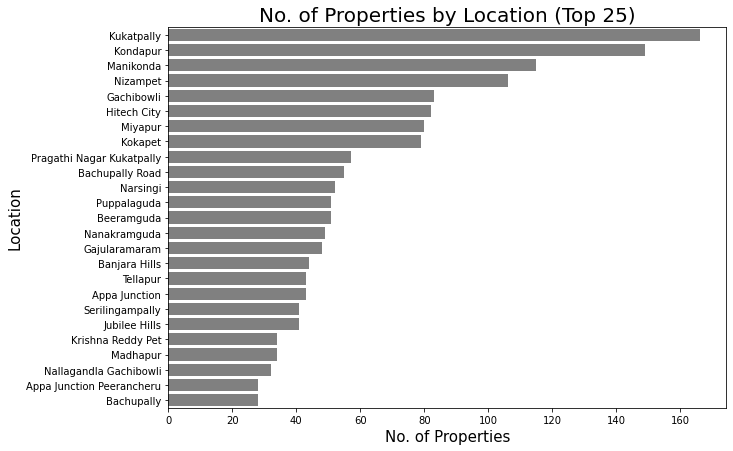

In [67]:
propertiesByLocation(hyderabad)

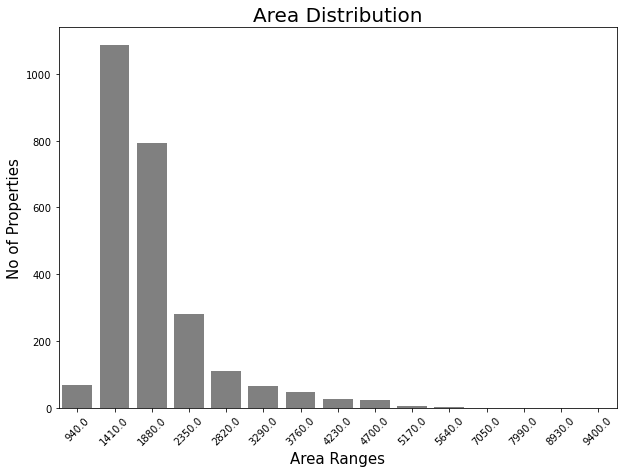

In [68]:
areaDistribution(hyderabad)

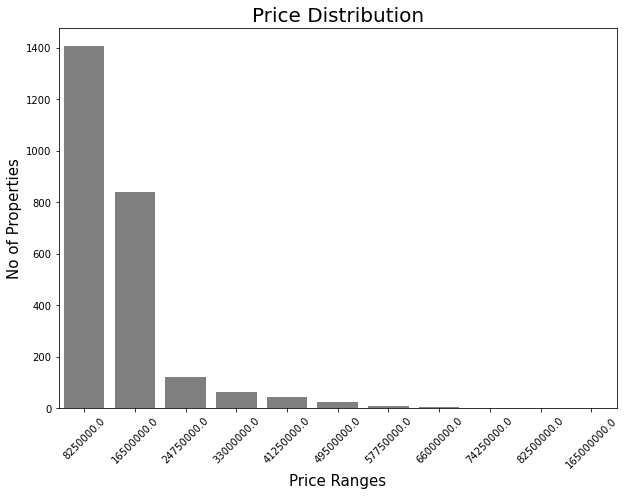

In [69]:
priceDistribution(hyderabad)

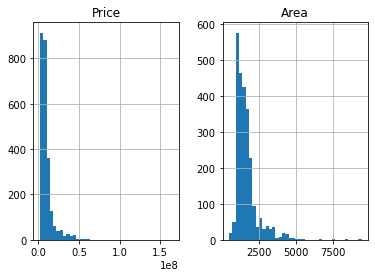

In [70]:
histPriceAndArea(hyderabad)

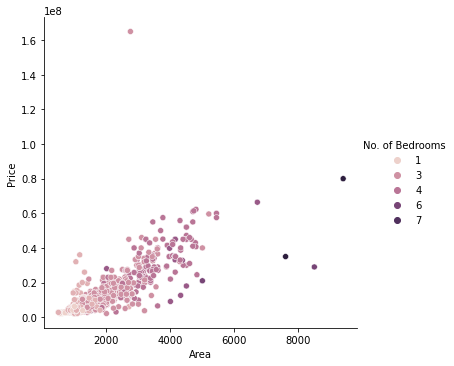

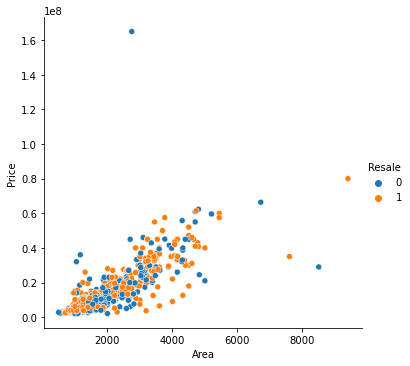

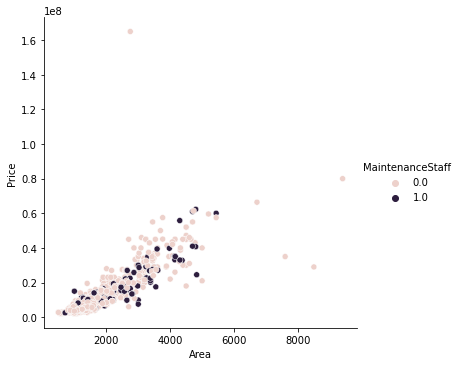

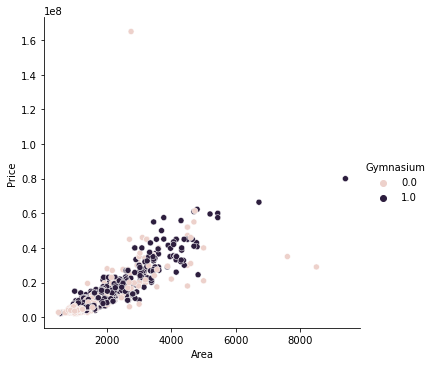

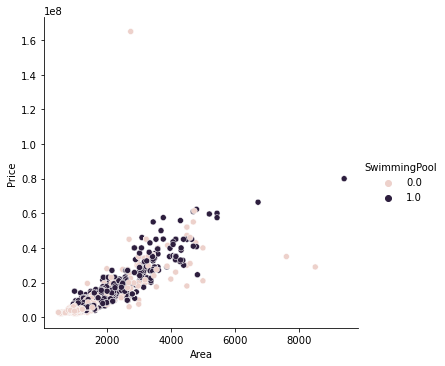

...

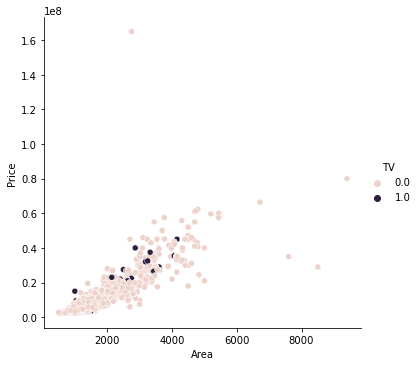

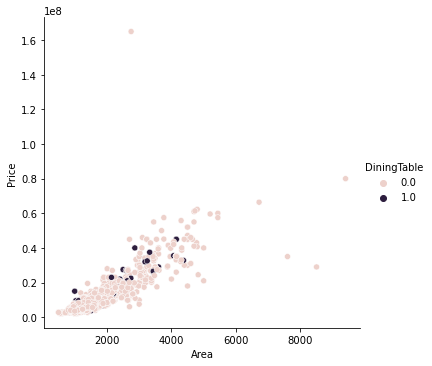

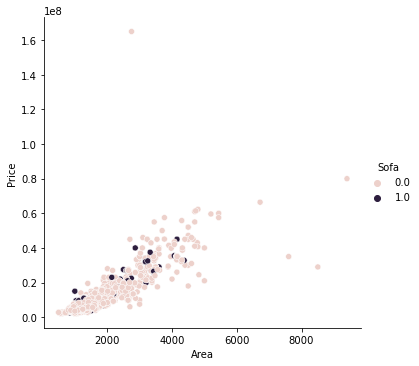

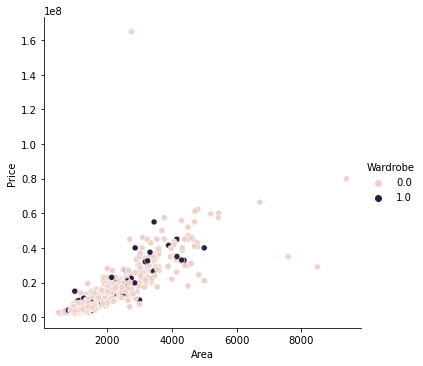

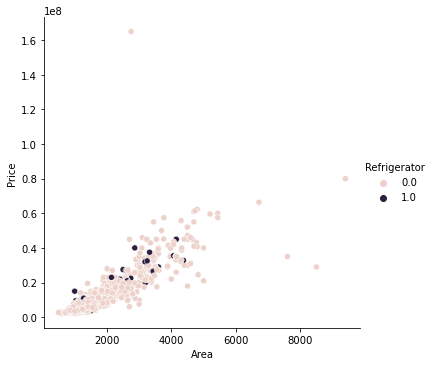

In [71]:
PriceAndArea(hyderabad)

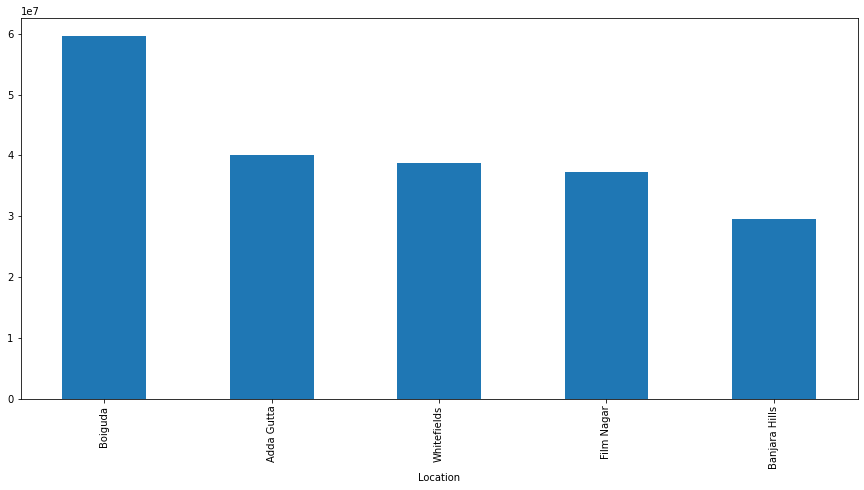

In [72]:
barplotWith5MostExpensiveAreas(hyderabad)

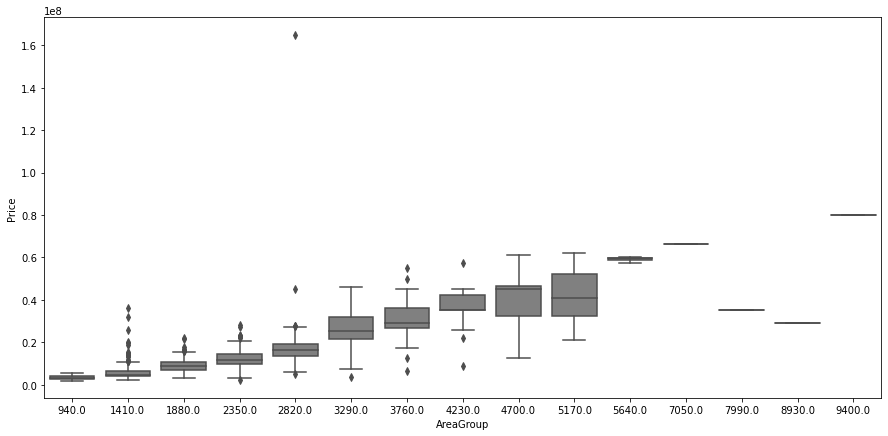

In [73]:
box(hyderabad)

## 5.4 Comments & Conclusions

Hyderabad dataset consists of 2518 rows and 40 columns. There are 84 NaN values (marked as '9') for every column apart from *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale*. Comparing to previous datasets it has the smallest ratio of NaN values to all records. For continuous variables such as *Price*, *Area* and *Location* there are 690, 579 and 243 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. We have only one strong correlation (approx 0.78) between *Swimming pool* and *Gymnasium*. Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup*. Above, we can notice that there is a strong correlation with *Area* (nearly 0.75) and surprisingly it is much stronger than in other datasets. Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Hyderabad are *Kukatpally* (over 160 properties), *Kondapur* (over 140) and *Manikonda* (over 100).
2. The most common size of the property varies between 1410-1880 sq feet (129-173 sq metres). 
3. The majority of houses costs less than 8250000.0 INR (100k EUR).
4. The most properties have 3-4 bedrooms, but there happen to be even 7 bedroom houses.
5. There are plenty of properties with swimming pool and gymnasium available in wide price ranges.
6. Hyderabad's most expensive area is *Boiguda* with average property prices higher than 60000000.0 INR (approx 715k EUR).

## 6. Kolkata Dataset

Kolkata, also known as Calcutta, is the capital of the Indian state of West Bengal. Located on the eastern bank of the Hooghly River, the city is approximately 80 kilometres (50 mi) west of the border with Bangladesh. It is the primary business, commercial, and financial hub of Eastern India and the main port of communication for North-East India.  It is the third-most populous metropolitan area in India. In 2021, Kolkata metropolitan area crossed 1.5 crore (15 million) registered voters.

## 6.1 Classic Overview

In [74]:
kolkata.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,2235000,1016,Barasat,3,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
1,3665999,1111,Keshtopur,2,0,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,3774000,1020,Rajarhat,2,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,2524000,935,Narendrapur,2,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
4,8300000,1956,New Town,3,1,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0


In [75]:
kolkata.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,6.507000e+03,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,...,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000,6507.000000
mean,8.508570e+06,1344.166897,2.631166,0.311818,8.899032,8.903028,8.901644,8.901644,8.900415,8.899493,...,8.905025,8.897034,8.899339,8.897034,8.896727,8.896727,8.896880,8.897034,8.896266,8.897034
std,1.465939e+07,807.698043,0.712283,0.463272,0.936229,0.899654,0.912482,0.912482,0.923734,0.932083,...,0.880791,0.953984,0.933467,0.953984,0.956686,0.956686,0.955336,0.953984,0.960724,0.953984
min,2.000000e+06,350.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.300000e+06,920.000000,2.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
50%,4.940000e+06,1144.000000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,8.000000e+06,1454.000000,3.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,5.040000e+08,10000.000000,9.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [76]:
kolkata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6507 entries, 0 to 6506
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                6507 non-null   int64 
 1   Area                 6507 non-null   int64 
 2   Location             6507 non-null   object
 3   No. of Bedrooms      6507 non-null   int64 
 4   Resale               6507 non-null   int64 
 5   MaintenanceStaff     6507 non-null   int64 
 6   Gymnasium            6507 non-null   int64 
 7   SwimmingPool         6507 non-null   int64 
 8   LandscapedGardens    6507 non-null   int64 
 9   JoggingTrack         6507 non-null   int64 
 10  RainWaterHarvesting  6507 non-null   int64 
 11  IndoorGames          6507 non-null   int64 
 12  ShoppingMall         6507 non-null   int64 
 13  Intercom             6507 non-null   int64 
 14  SportsFacility       6507 non-null   int64 
 15  ATM                  6507 non-null   int64 
 16  ClubHo

In [77]:
checkNaNs(kolkata)

Price                     0
Area                      0
Location                  0
No. of Bedrooms           1
Resale                    0
MaintenanceStaff       6432
Gymnasium              6432
SwimmingPool           6432
LandscapedGardens      6432
JoggingTrack           6432
RainWaterHarvesting    6432
IndoorGames            6432
ShoppingMall           6432
Intercom               6432
SportsFacility         6432
ATM                    6432
ClubHouse              6432
School                 6432
24X7Security           6432
PowerBackup            6432
CarParking             6432
StaffQuarter           6432
Cafeteria              6432
MultipurposeRoom       6432
Hospital               6432
WashingMachine         6432
Gasconnection          6432
AC                     6432
Wifi                   6432
Children'splayarea     6432
LiftAvailable          6432
BED                    6432
VaastuCompliant        6432
Microwave              6432
GolfCourse             6432
TV                  

In [78]:
countUnique4Columns(kolkata)

,ColumnName,NumberOfUnique
0,Price,1660
1,Area,1188
2,Location,308
3,No. of Bedrooms,7
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 6.2 Correlations Check

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))
<ipython-input-4-d3ec133d51ec>:44: RuntimeWarning: invalid value encountered in double_scalars

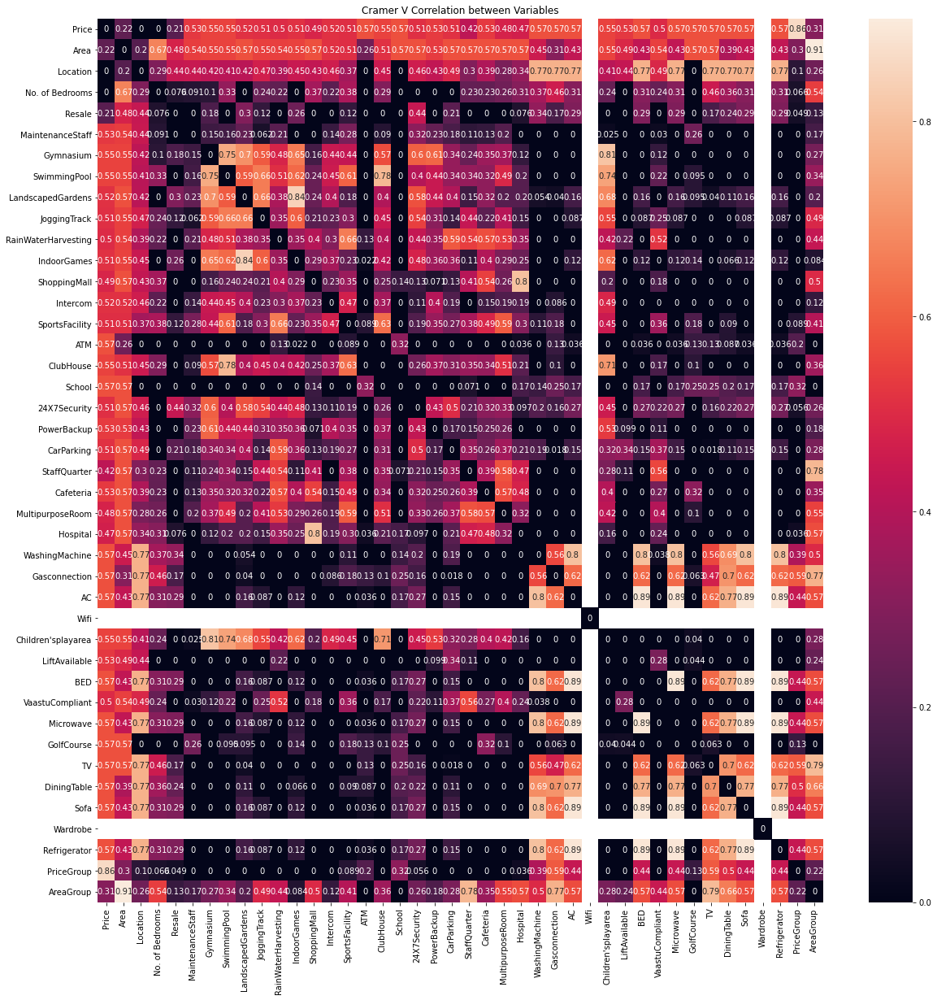

In [79]:
corrPlot(kolkata,20,20)

In [80]:
checkStrongCorrelations(kolkata,0.75)

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarnin

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,Column1,Column2,Correlation
0,Location,WashingMachine,1.000000
1,Location,Gasconnection,1.000000
2,Location,AC,1.000000
3,Location,BED,1.000000
4,Location,Microwave,1.000000
5,Location,TV,1.000000
6,Location,DiningTable,1.000000
7,Location,Sofa,1.000000
8,Location,Refrigerator,1.000000
9,AC,BED,0.797194


In [81]:
strongestCorr4SpecifiedColumn(kolkata,"PriceGroup")

<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))
<ipython-input-4-d3ec133d51ec>:30: RuntimeWarning: invalid value encountered in true_divide
  return (stat/(obs*mini))


,ColumnName,Correlation
0,Price,1.000000
40,PriceGroup,1.000000
35,TV,0.359660
26,Gasconnection,0.359660
1,Area,0.270304
36,DiningTable,0.263367
39,Refrigerator,0.205602
37,Sofa,0.205602
33,Microwave,0.205602
31,BED,0.205602


## 6.3 Plots Exploring

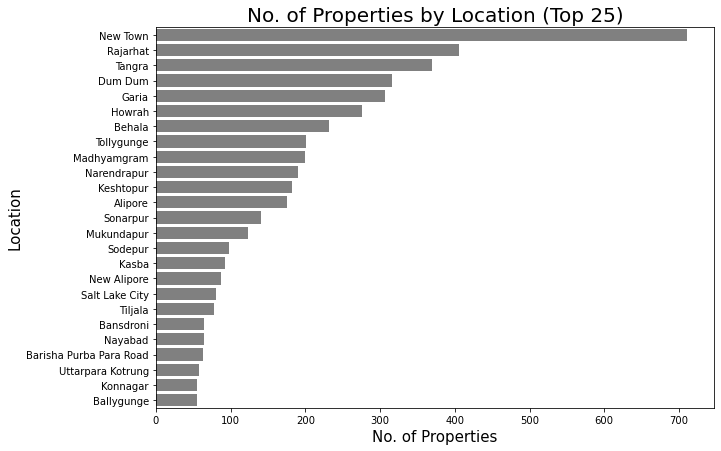

In [82]:
propertiesByLocation(kolkata)

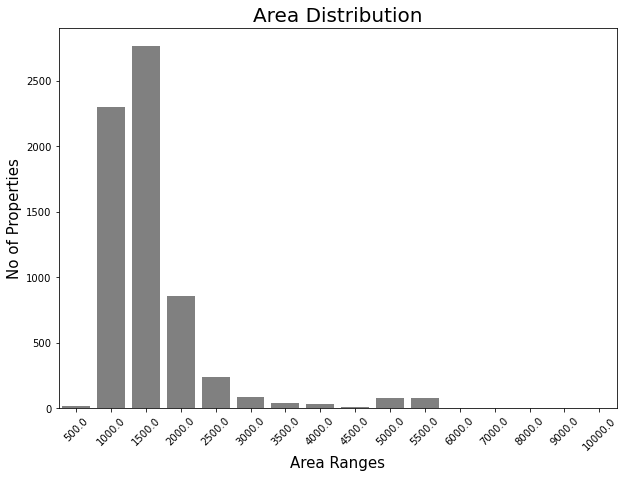

In [83]:
areaDistribution(kolkata)

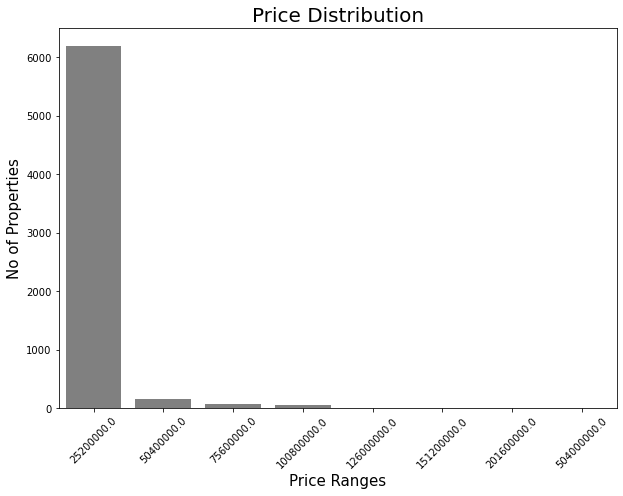

In [84]:
priceDistribution(kolkata)

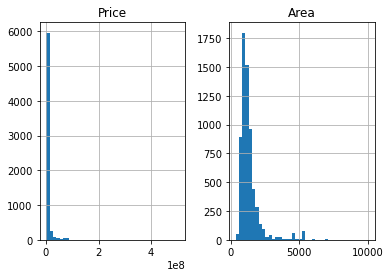

In [85]:
histPriceAndArea(kolkata)

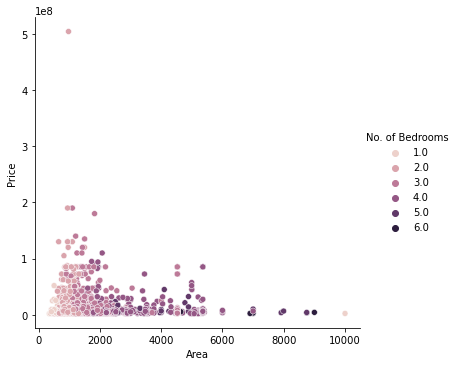

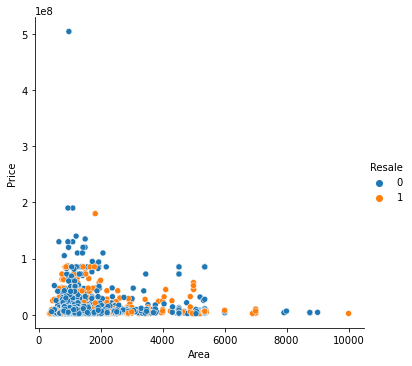

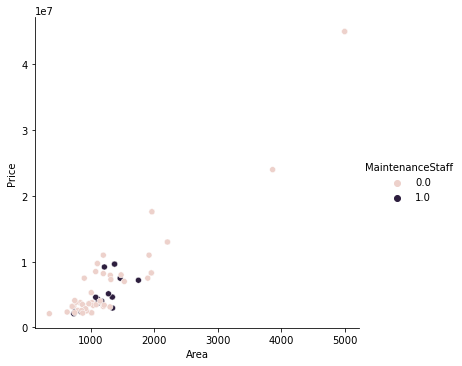

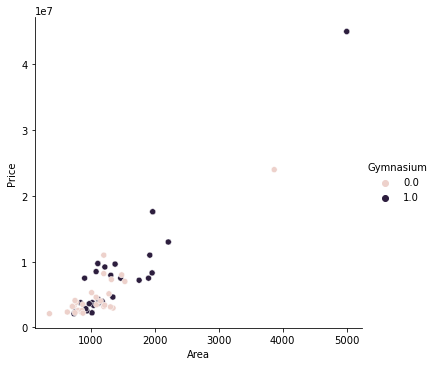

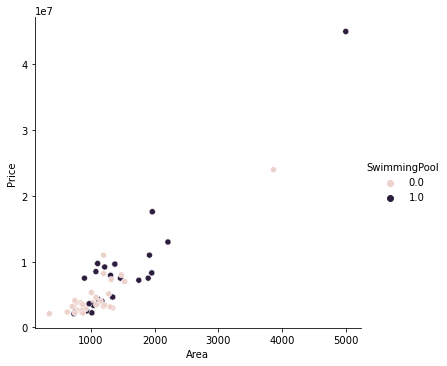

...

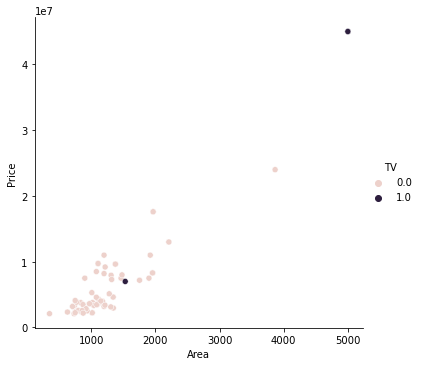

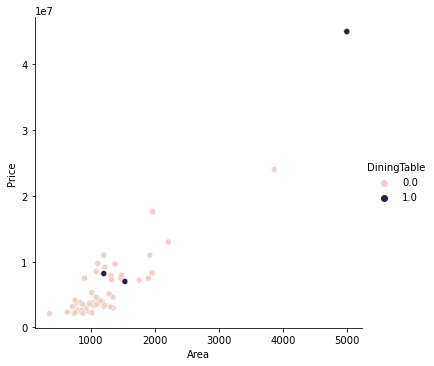

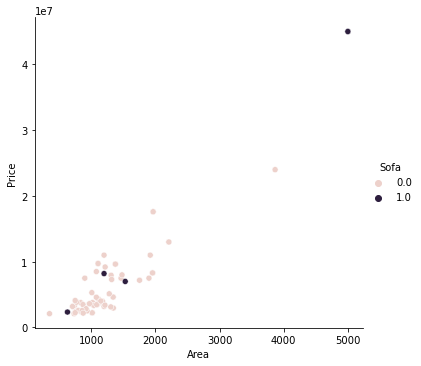

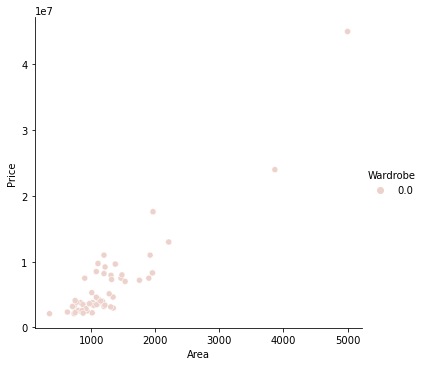

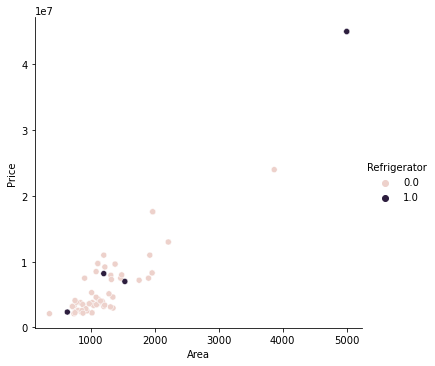

In [86]:
PriceAndArea(kolkata)

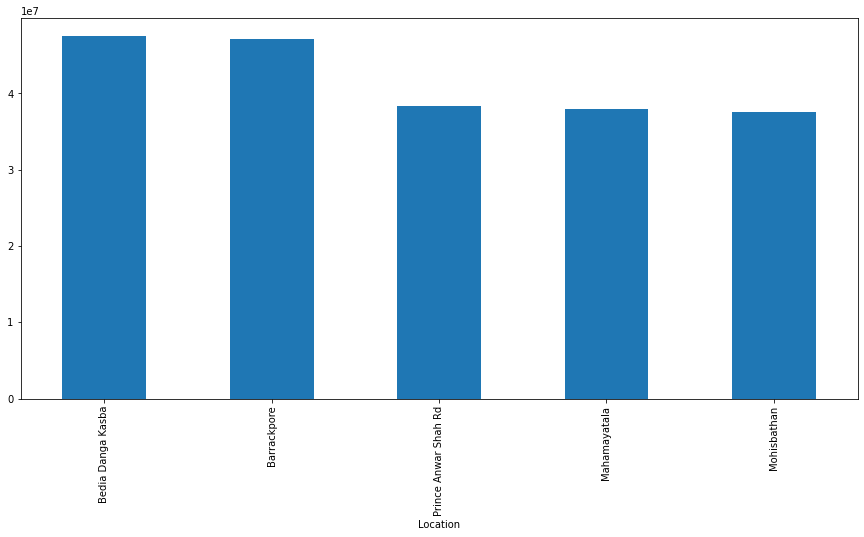

In [87]:
barplotWith5MostExpensiveAreas(kolkata)

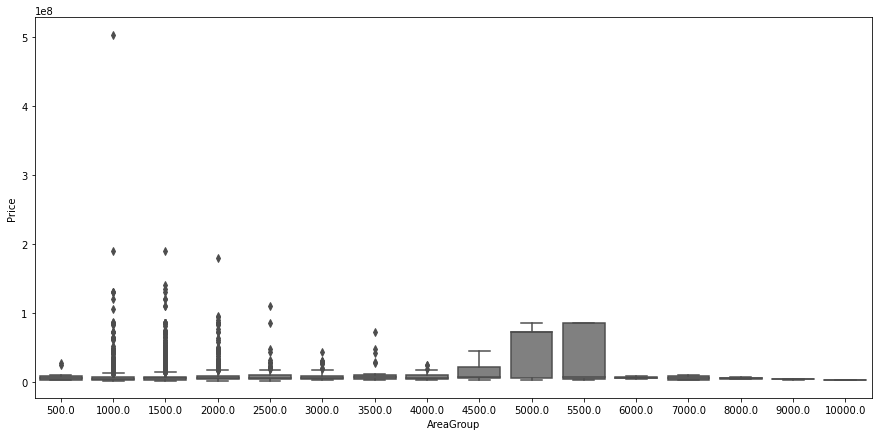

In [88]:
box(kolkata)

## 6.4 Comments & Conclusions

Kolkata dataset consists of 6507 rows and 40 columns. There are 6432 NaN values (marked as '9') for every column apart from *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale*. For continuous variables such as *Price*, *Area* and *Location* there are 1660, 1188 and 308 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. There is a really strong correlation (1.00) between *Location* and coulmns such as *WashingMachine*, *GasConnection*, *AC*, *BED*, *Microwave*, *TV*, *DiningTable*, *Sofa* and *Refrigerator*. Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup*. Above, we can notice that there aren't really any strong correlations and contrary to previous datasets *Area* hasn't got the highest correlation value with *PriceGroup* among all columns excluding of course *Price*. Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Kolkata are *New Town* (nearly 700 properties), *Rajarhat* and *Tangra* (both nearly 400 properties).
2. The most common size of the property varies between 1000-1500 sq feet (92-138 sq metres). 
3. The majority of houses costs less than 25200000.0 INR (300k EUR).
4. Strangely, there are 6 bedroom properties over 6000 sq feet with low price.
5. The majority of properties have no gas connection.
6. Kolkata's most expensive areas are *Bedia Danga Kasba* and *Barrackpore* with average property prices higher than 40000000.0 INR (approx 480k EUR).

## 7. Mumbai Dataset

Mumbai, also known as Bombay, is the capital city of the Indian state of Maharashtra and the de facto financial centre of India. According to the United Nations, as of 2018, Mumbai is the second-most populous city in India after Delhi and the eighth-most populous city in the world with a population of roughly 2 crore (20 million). Mumbai is home to three UNESCO World Heritage Sites: the Elephanta Caves, Chhatrapati Shivaji Maharaj Terminus, and the city's distinctive ensemble of Victorian and Art Deco buildings designed in the 19th and 20th centuries.

## 7.1 Classic Overview

In [89]:
mumbai.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
0,4850000,720,Kharghar,1,1,1,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
1,4500000,600,Kharghar,1,1,1,1,1,0,1,...,1,0,1,0,0,0,0,0,0,0
2,6700000,650,Kharghar,1,1,1,1,1,0,1,...,1,0,1,0,0,0,0,0,0,0
3,4500000,650,Kharghar,1,1,1,0,0,1,0,...,1,1,1,0,0,0,0,0,1,0
4,5000000,665,Kharghar,1,1,1,0,0,1,0,...,1,0,1,0,0,0,0,0,0,0


In [90]:
mumbai.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator
count,7.719000e+03,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,...,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000,7719.000000
mean,1.506165e+07,998.409250,1.913331,0.647105,7.498899,7.473896,7.437881,7.441638,7.439435,7.477005,...,7.518331,7.417930,7.454722,7.372069,7.379712,7.379065,7.373624,7.374530,7.383988,7.374789
std,2.052100e+07,550.967809,0.855376,0.477901,3.197923,3.252095,3.328245,3.320401,3.325002,3.245418,...,3.155041,3.369523,3.292904,3.462108,3.446892,3.448185,3.459020,3.457217,3.438345,3.456702
min,2.000000e+06,200.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.300000e+06,650.000000,1.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
50%,9.500000e+06,900.000000,2.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,1.700000e+07,1177.000000,2.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,4.200000e+08,8511.000000,7.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


In [91]:
mumbai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7719 entries, 0 to 7718
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Price                7719 non-null   int64 
 1   Area                 7719 non-null   int64 
 2   Location             7719 non-null   object
 3   No. of Bedrooms      7719 non-null   int64 
 4   Resale               7719 non-null   int64 
 5   MaintenanceStaff     7719 non-null   int64 
 6   Gymnasium            7719 non-null   int64 
 7   SwimmingPool         7719 non-null   int64 
 8   LandscapedGardens    7719 non-null   int64 
 9   JoggingTrack         7719 non-null   int64 
 10  RainWaterHarvesting  7719 non-null   int64 
 11  IndoorGames          7719 non-null   int64 
 12  ShoppingMall         7719 non-null   int64 
 13  Intercom             7719 non-null   int64 
 14  SportsFacility       7719 non-null   int64 
 15  ATM                  7719 non-null   int64 
 16  ClubHo

In [92]:
checkNaNs(mumbai)

Price                     0
Area                      0
Location                  0
No. of Bedrooms           0
Resale                    0
MaintenanceStaff       6321
Gymnasium              6321
SwimmingPool           6321
LandscapedGardens      6321
JoggingTrack           6321
RainWaterHarvesting    6321
IndoorGames            6321
ShoppingMall           6321
Intercom               6321
SportsFacility         6321
ATM                    6321
ClubHouse              6321
School                 6321
24X7Security           6321
PowerBackup            6321
CarParking             6321
StaffQuarter           6321
Cafeteria              6321
MultipurposeRoom       6321
Hospital               6321
WashingMachine         6321
Gasconnection          6321
AC                     6321
Wifi                   6321
Children'splayarea     6321
LiftAvailable          6321
BED                    6321
VaastuCompliant        6321
Microwave              6321
GolfCourse             6321
TV                  

In [93]:
countUnique4Columns(mumbai)

,ColumnName,NumberOfUnique
0,Price,977
1,Area,1140
2,Location,413
3,No. of Bedrooms,7
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 7.2 Correlations Check

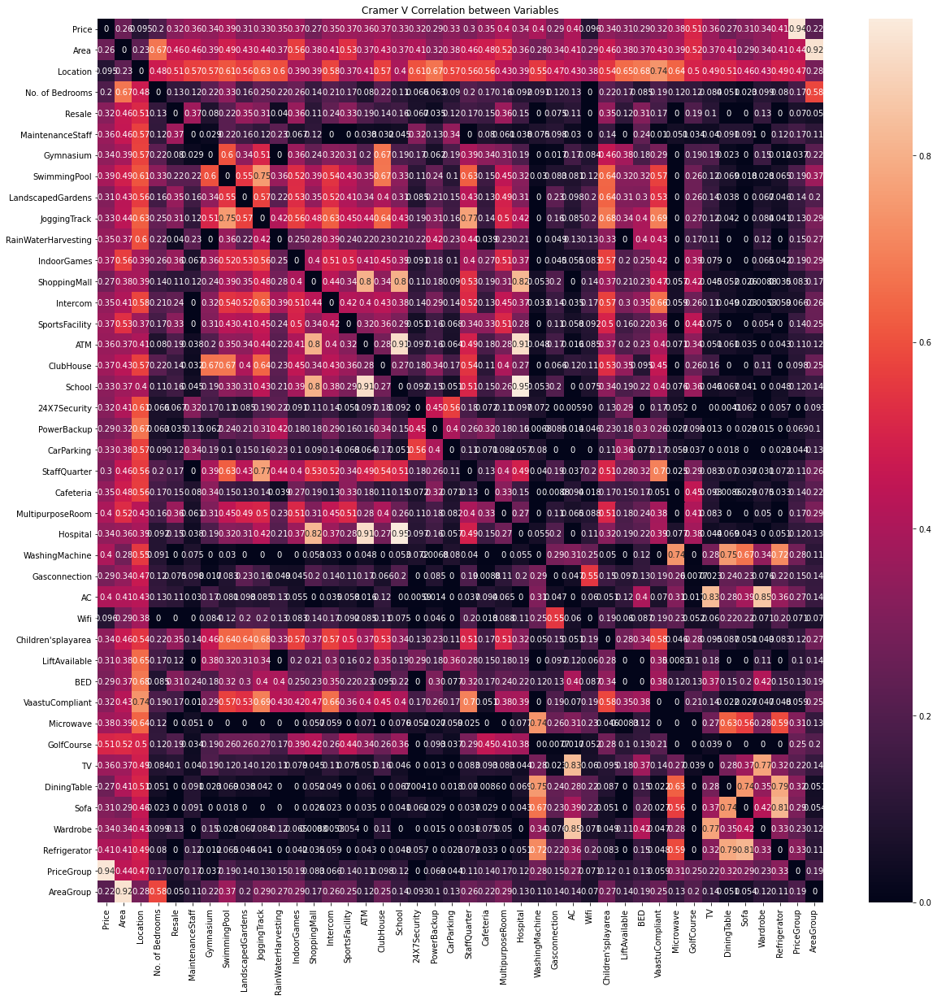

In [94]:
corrPlot(mumbai,20,20)

In [95]:
checkStrongCorrelations(mumbai,0.75)

,Column1,Column2,Correlation
0,ATM,School,0.829559
1,ATM,Hospital,0.833434
2,School,Hospital,0.896314


In [96]:
strongestCorr4SpecifiedColumn(mumbai,"PriceGroup")

,ColumnName,Correlation
0,Price,1.000000
40,PriceGroup,1.000000
1,Area,0.343519
2,Location,0.277515
39,Refrigerator,0.115195
36,DiningTable,0.111734
33,Microwave,0.105035
37,Sofa,0.094063
25,WashingMachine,0.083565
27,AC,0.081699


## 7.3 Plots Exploring

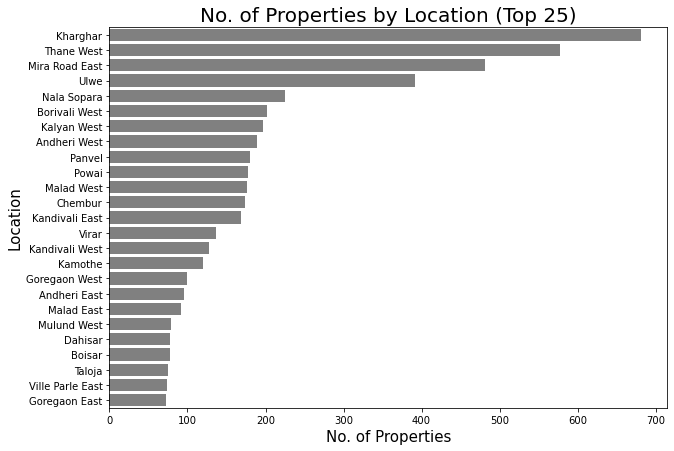

In [97]:
propertiesByLocation(mumbai)

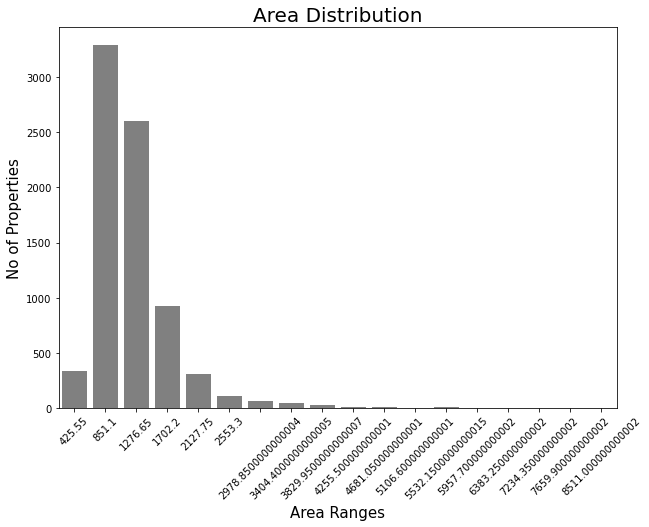

In [98]:
areaDistribution(mumbai)

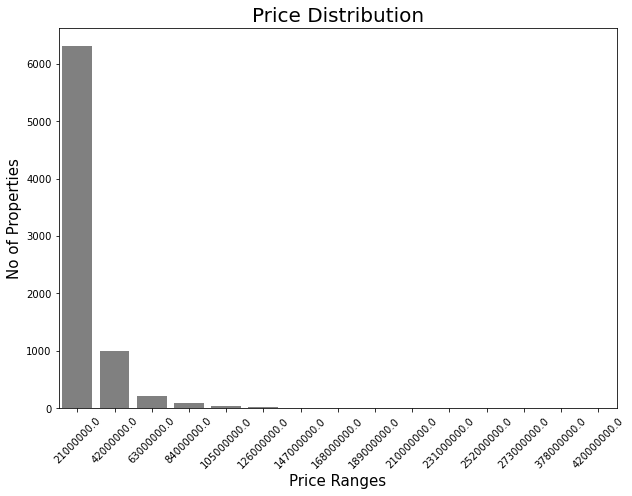

In [99]:
priceDistribution(mumbai)

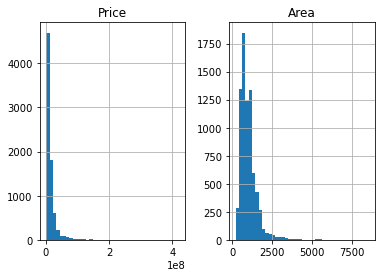

In [100]:
histPriceAndArea(mumbai)

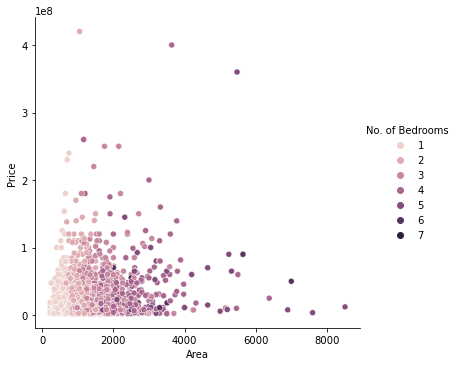

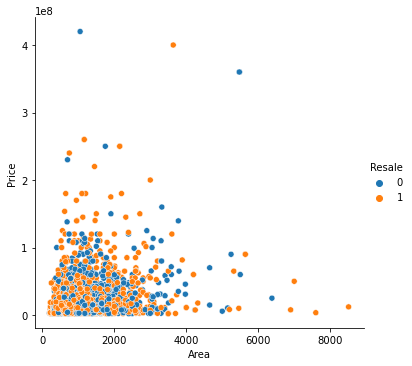

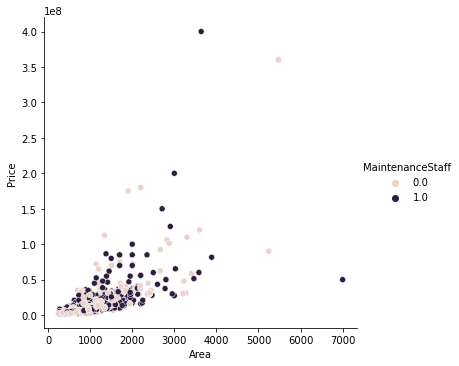

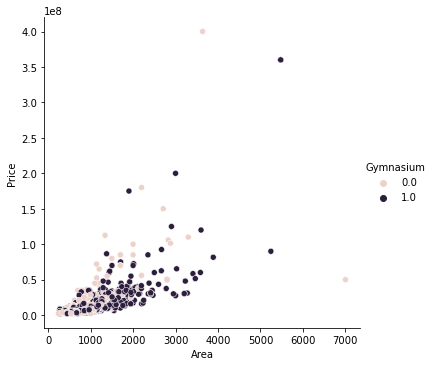

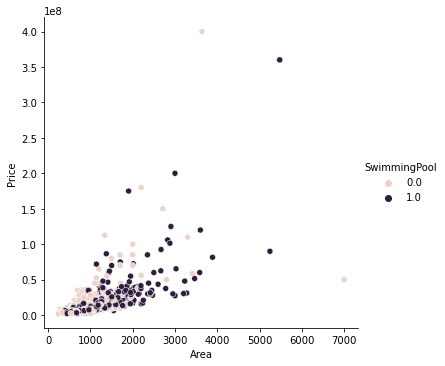

...

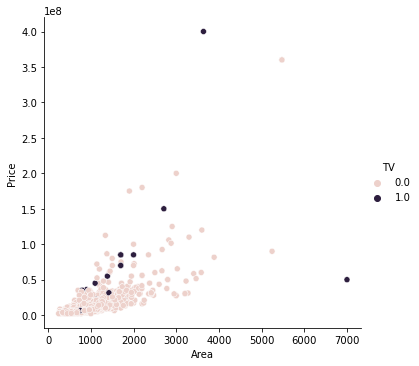

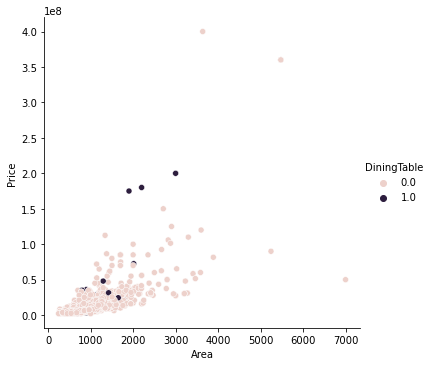

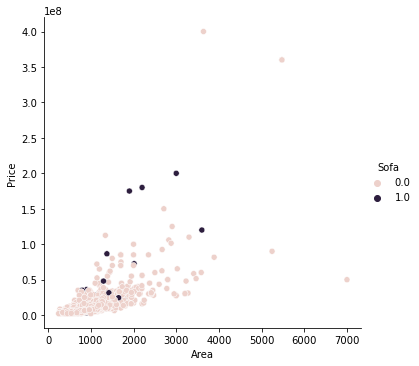

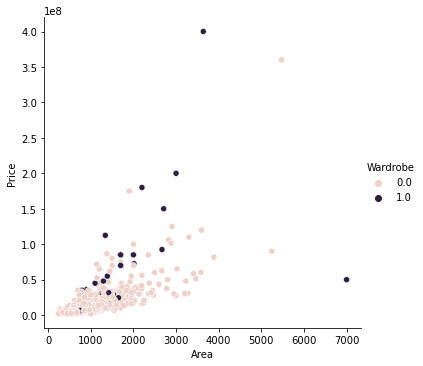

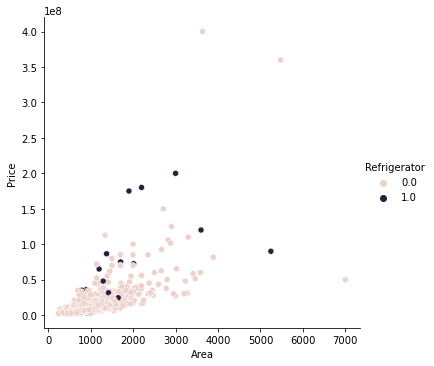

In [101]:
PriceAndArea(mumbai)

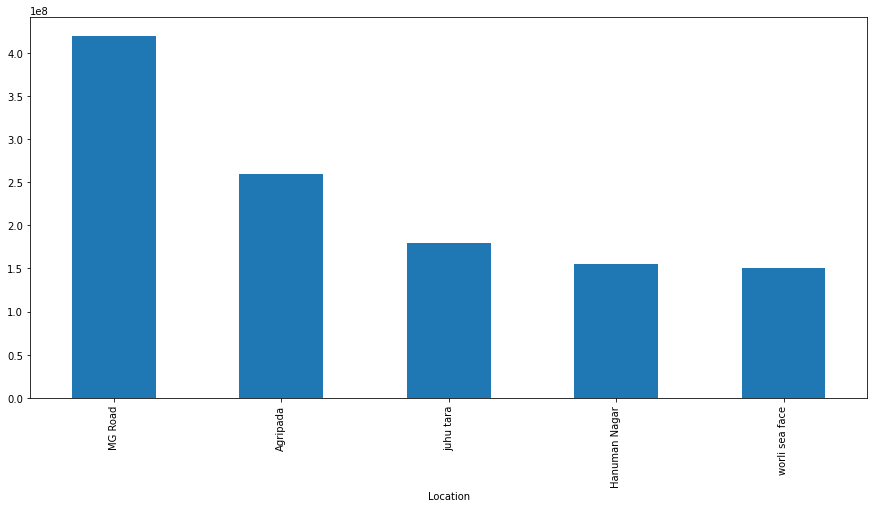

In [102]:
barplotWith5MostExpensiveAreas(mumbai)

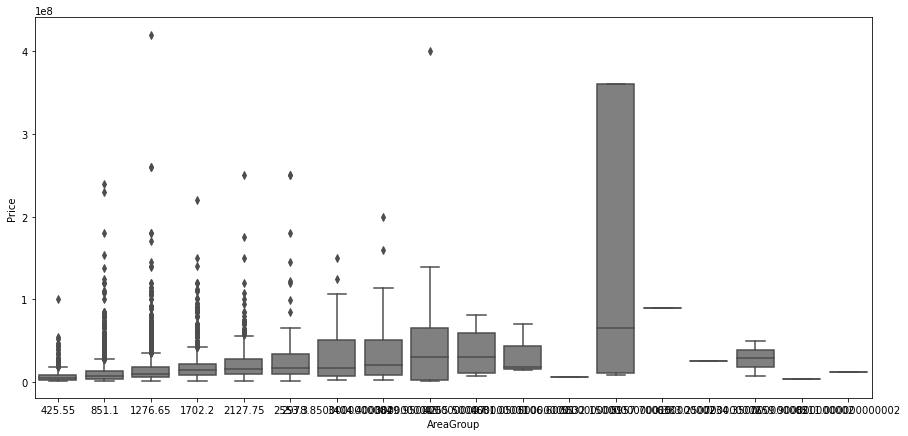

In [103]:
box(mumbai)

## 7.4 Comments & Conclusions

Mumbai dataset consists of 7719 rows and 40 columns. There are 6321 NaN values (marked as '9') for every column apart from *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale*. For continuous variables such as *Price*, *Area* and *Location* there are 977, 1140 and 413 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. The most associated columns are *Hospital*, *School* and *ATM* (correlation value over 0.83). Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup* but we can notice above that there aren't really any strong correlations. Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in Mumbai are *Kharghar* (nearly 700 properties), *Thane West* (nearly 600) and *Mira Road East* (nearly 500).
2. The most common size of the property varies between 851-1276 sq feet (78-120 sq metres). 
3. The majority of houses costs less than 21000000.0 INR (250k EUR).
4. Not only expensive properties have 24/7 security - it is available for all price ranges.
5. There is a noticable majority of properties with lift and car parking.
6. Mumbai's most expensive area is *MG Road* with average property price higher than 400000000.0 INR (nearly 5M EUR!). Mumbai has the highest number of millionaires and billionaires among all cities in India, so maybe that's the reason why it's so expensive.

## 8. All in One

In [88]:
bangalore['City'] = 'Bangalore'
chennai['City'] = 'Chennai'
delhi['City'] = 'Delhi'
hyderabad['City'] = 'Hyderabad'
kolkata['City'] = 'Kolkata'
mumbai['City'] = "Mumbai"

india = result = pd.concat([bangalore, chennai, delhi, hyderabad, kolkata, mumbai])

## 8.1 Classic Overview

In [89]:
india.head()

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,PriceGroup,AreaGroup,City
0,30000000,3340,JP Nagar Phase 1,4,0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30000000.0,3465.0,Bangalore
1,7888000,1045,Dasarahalli on Tumkur Road,2,0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15000000.0,1485.0,Bangalore
2,4866000,1179,Kannur on Thanisandra Main Road,2,0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15000000.0,1485.0,Bangalore
3,8358000,1675,Doddanekundi,3,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15000000.0,1980.0,Bangalore
4,6845000,1670,Kengeri,3,0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15000000.0,1980.0,Bangalore


In [90]:
india.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Refrigerator,PriceGroup,AreaGroup
count,3.296300e+04,32963.000000,32963.000000,32963.000000,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,...,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,25926.000000,6.207000e+03,6207.000000
mean,1.168672e+07,1293.362194,2.411765,0.381397,5.562640,5.699028,5.657834,5.632184,5.626051,5.639435,...,5.612281,5.515236,5.504706,5.517936,5.516817,5.516123,5.504436,5.516316,1.863944e+07,1779.751087
std,2.307368e+07,763.703754,0.812800,0.485737,4.311702,4.146221,4.197357,4.228682,4.236115,4.219866,...,4.252723,4.366752,4.378817,4.363649,4.364935,4.365733,4.379126,4.365511,1.381817e+07,769.594927
min,2.000000e+06,200.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000e+07,495.000000
25%,4.071500e+06,853.000000,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000e+07,1485.000000
50%,6.711000e+06,1125.000000,2.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.500000e+07,1485.000000
75%,1.200000e+07,1500.000000,3.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.500000e+07,1980.000000
max,8.546000e+08,16000.000000,9.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,3.000000e+08,9900.000000


In [91]:
india.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32963 entries, 0 to 7718
Data columns (total 43 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Price                32963 non-null  int64  
 1   Area                 32963 non-null  int64  
 2   Location             32963 non-null  object 
 3   No. of Bedrooms      32963 non-null  int64  
 4   Resale               32963 non-null  int64  
 5   MaintenanceStaff     25926 non-null  float64
 6   Gymnasium            25926 non-null  float64
 7   SwimmingPool         25926 non-null  float64
 8   LandscapedGardens    25926 non-null  float64
 9   JoggingTrack         25926 non-null  float64
 10  RainWaterHarvesting  25926 non-null  float64
 11  IndoorGames          25926 non-null  float64
 12  ShoppingMall         25926 non-null  float64
 13  Intercom             25926 non-null  float64
 14  SportsFacility       25926 non-null  float64
 15  ATM                  25926 non-null  

In [92]:
checkNaNs(india)

Price                      0
Area                       0
Location                   0
No. of Bedrooms            1
Resale                     0
MaintenanceStaff       22870
Gymnasium              22870
SwimmingPool           22870
LandscapedGardens      22870
JoggingTrack           22870
RainWaterHarvesting    22870
IndoorGames            22870
ShoppingMall           22870
Intercom               22870
SportsFacility         22870
ATM                    22870
ClubHouse              22870
School                 22870
24X7Security           22870
PowerBackup            22870
CarParking             22870
StaffQuarter           22870
Cafeteria              22870
MultipurposeRoom       22870
Hospital               22870
WashingMachine         22870
Gasconnection          22870
AC                     22870
Wifi                   22870
Children'splayarea     22870
LiftAvailable          22870
BED                    22870
VaastuCompliant        22870
Microwave              22870
GolfCourse    

In [93]:
countUnique4Columns(india)

,ColumnName,NumberOfUnique
0,Price,4924
1,Area,2452
2,Location,1776
3,No. of Bedrooms,9
4,Resale,2
5,MaintenanceStaff,3
6,Gymnasium,3
7,SwimmingPool,3
8,LandscapedGardens,3
9,JoggingTrack,3


## 8.2 Correlations Check

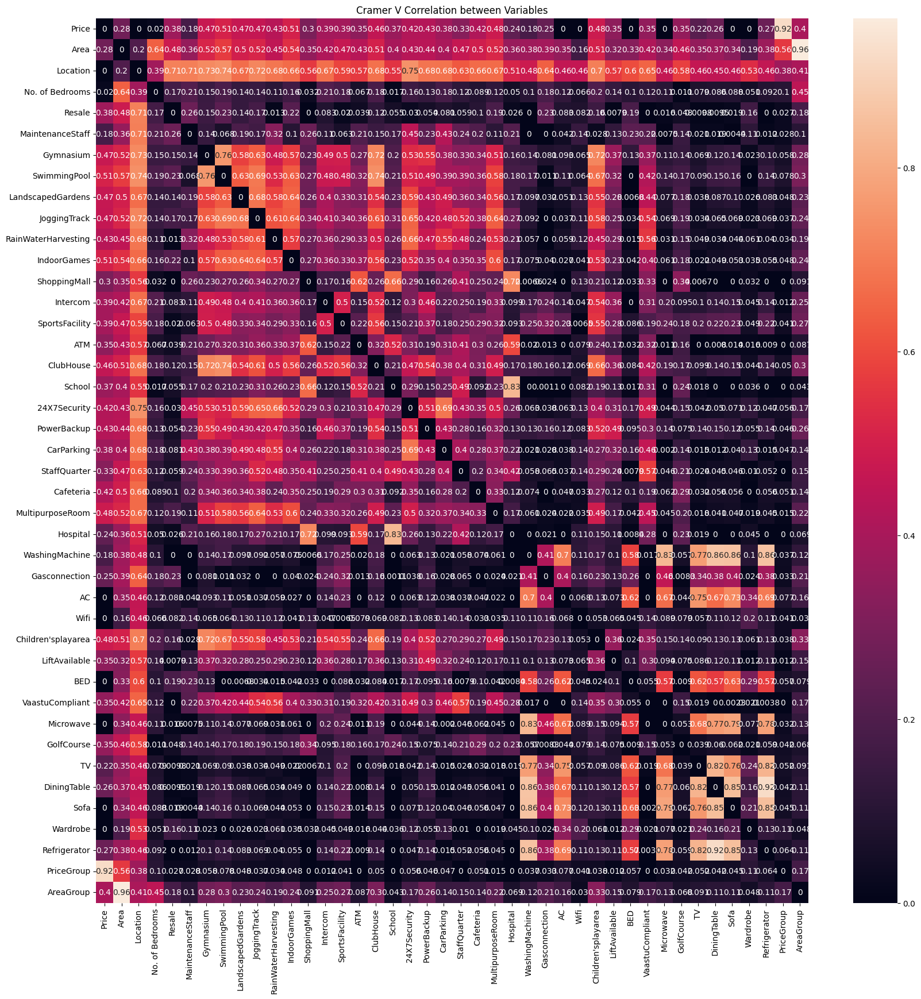

In [94]:
corrPlot(india,20,20)
plt.show()

In [95]:
checkStrongCorrelations(india,0.75)

,Column1,Column2,Correlation
0,Location,City,0.997929
1,DiningTable,Refrigerator,0.849693


In [96]:
strongestCorr4SpecifiedColumn(india,"PriceGroup")

,ColumnName,Correlation
0,Price,1.000000
40,PriceGroup,1.000000
1,Area,0.388080
2,Location,0.196294
41,AreaGroup,0.030443
38,Wardrobe,0.012114
3,No. of Bedrooms,0.010667
7,SwimmingPool,0.006604
27,AC,0.006481
39,Refrigerator,0.004646


## 8.3 Plots Exploring

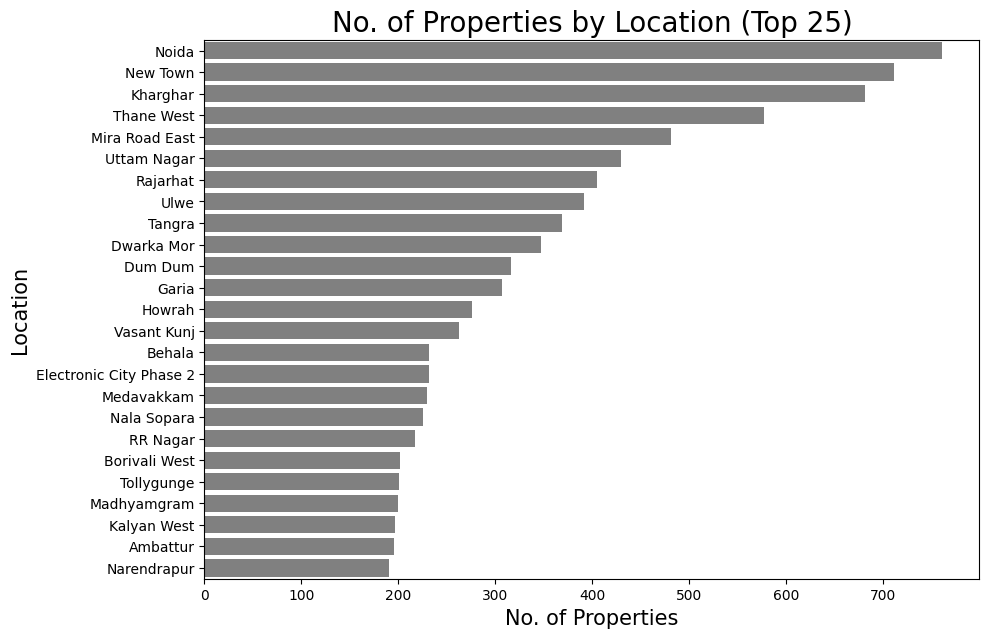

In [97]:
propertiesByLocation(india)

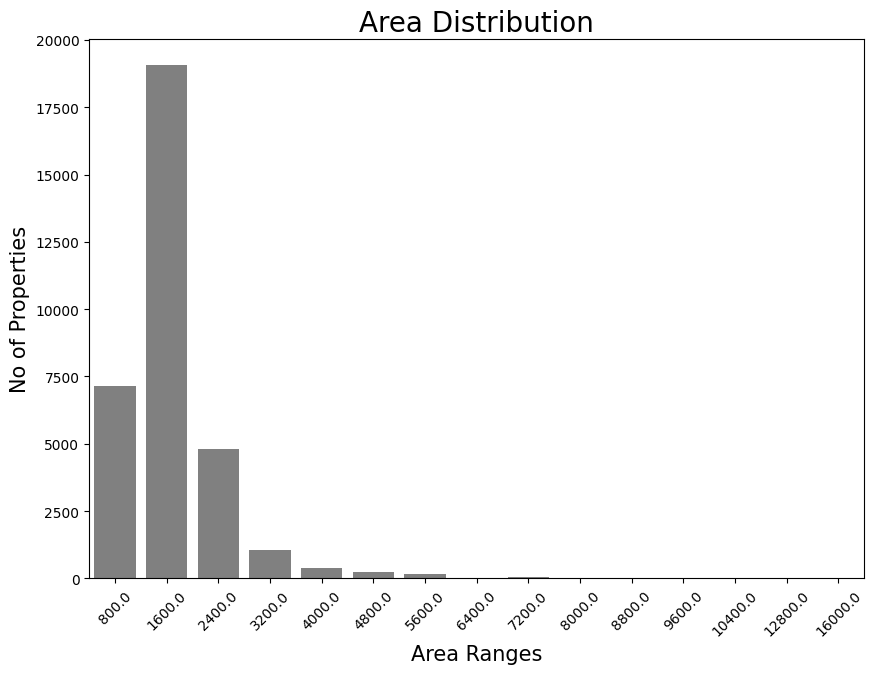

In [98]:
areaDistribution(india)

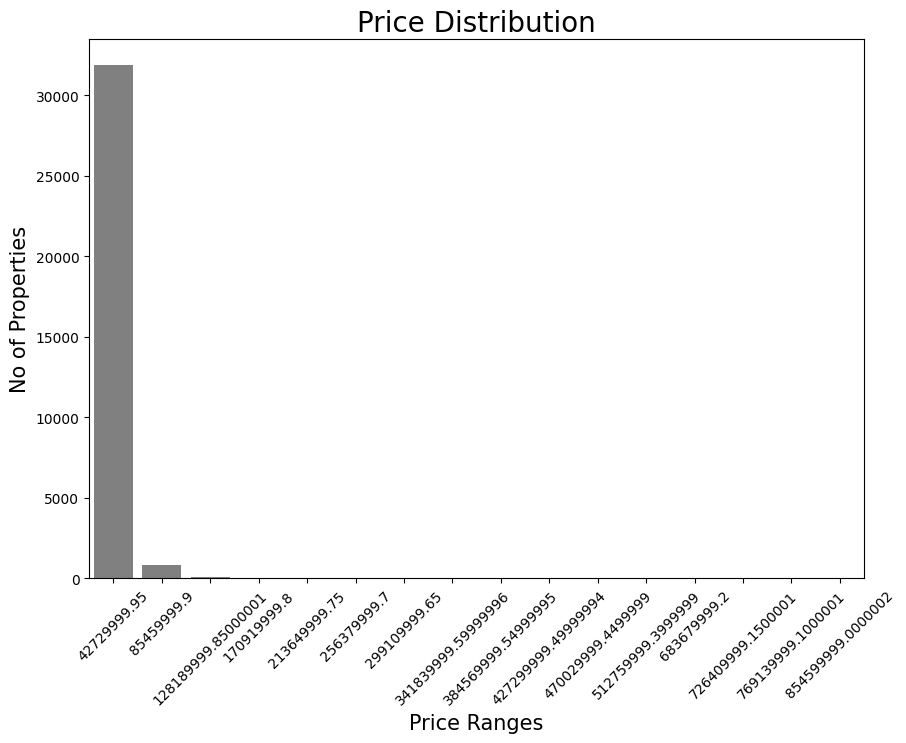

In [41]:
priceDistribution(india)

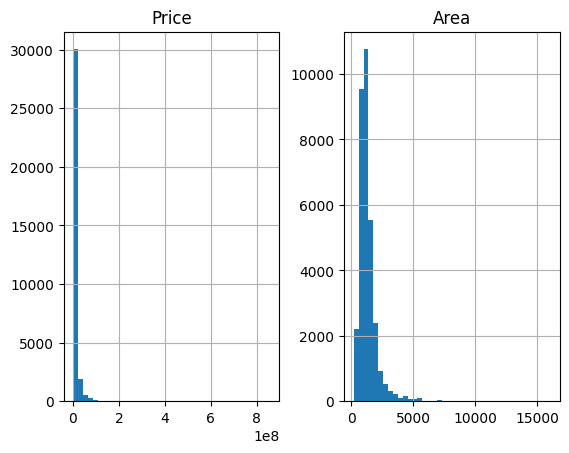

In [45]:
histPriceAndArea(india)
plt.show()

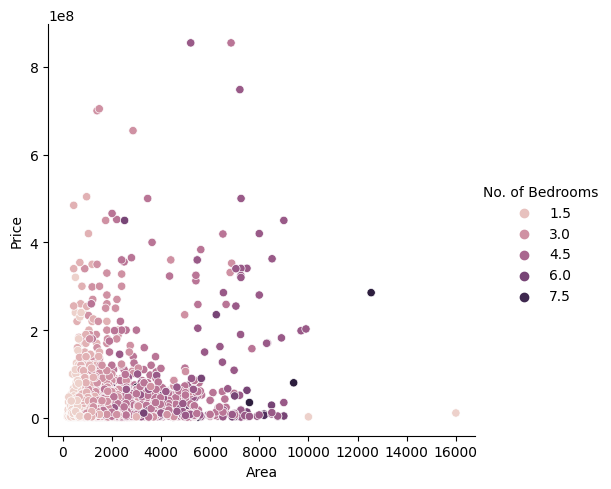

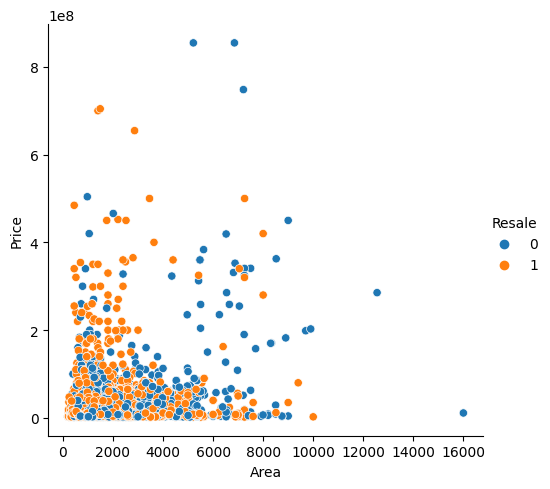

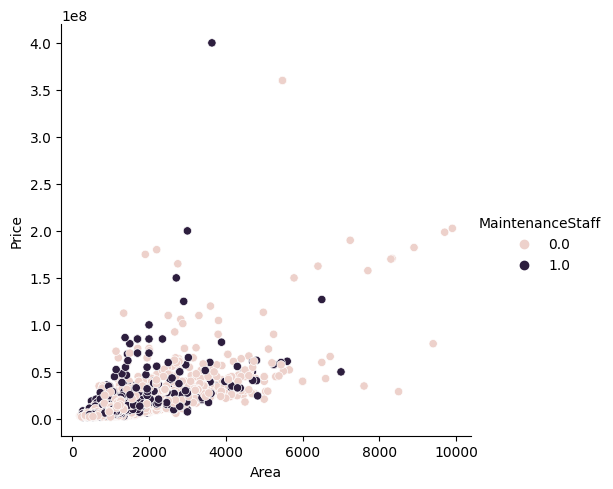

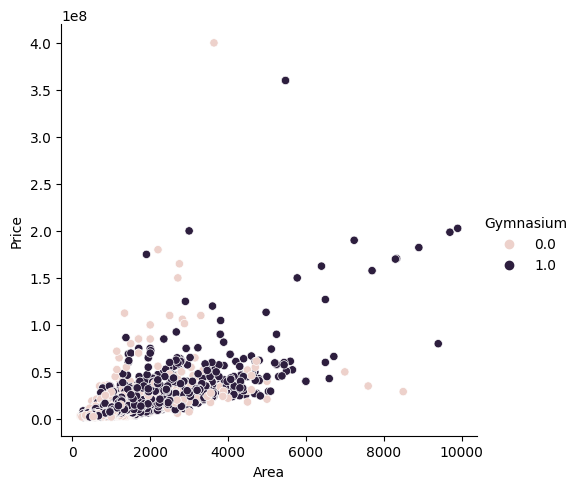

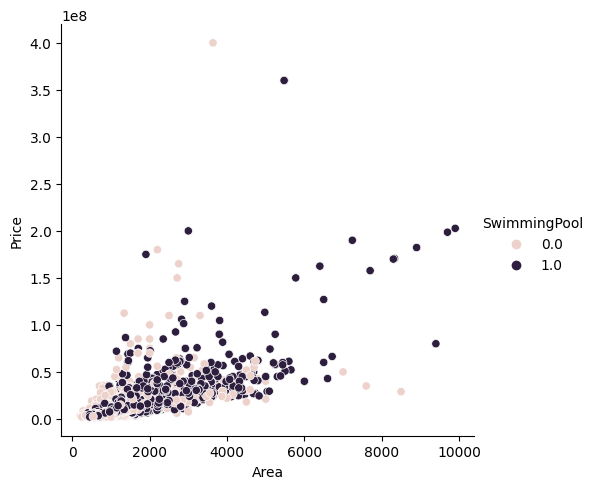

...

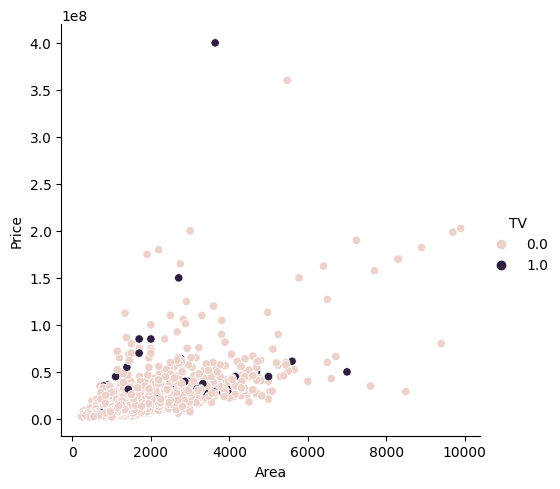

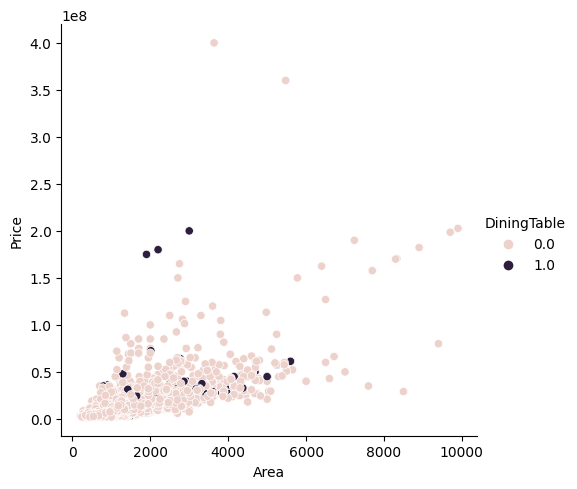

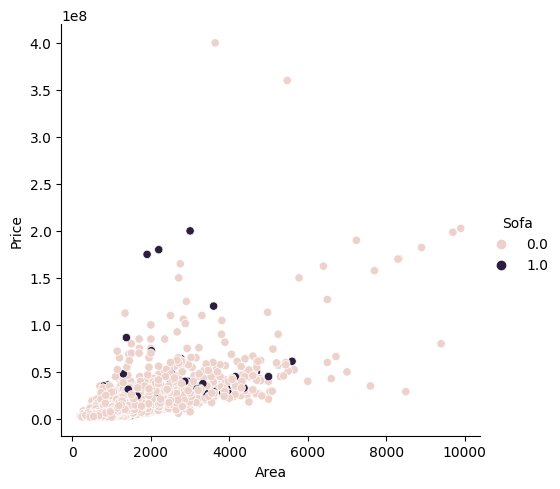

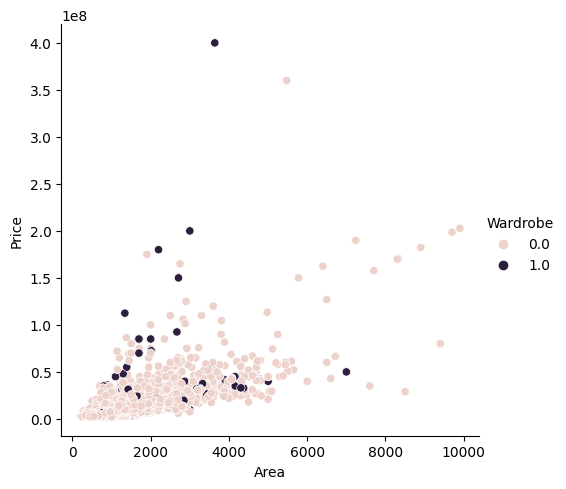

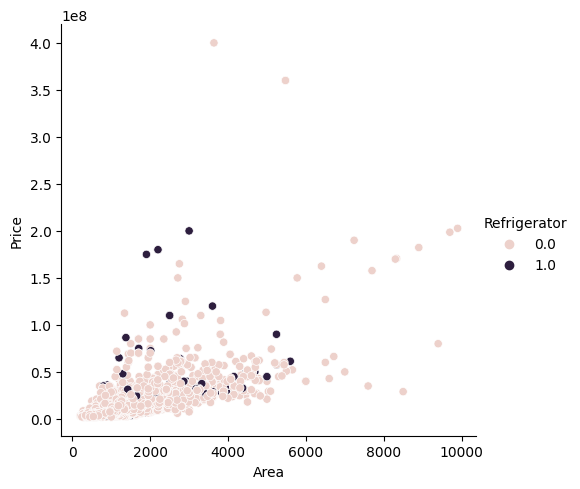

In [99]:
PriceAndArea(india)
plt.show()

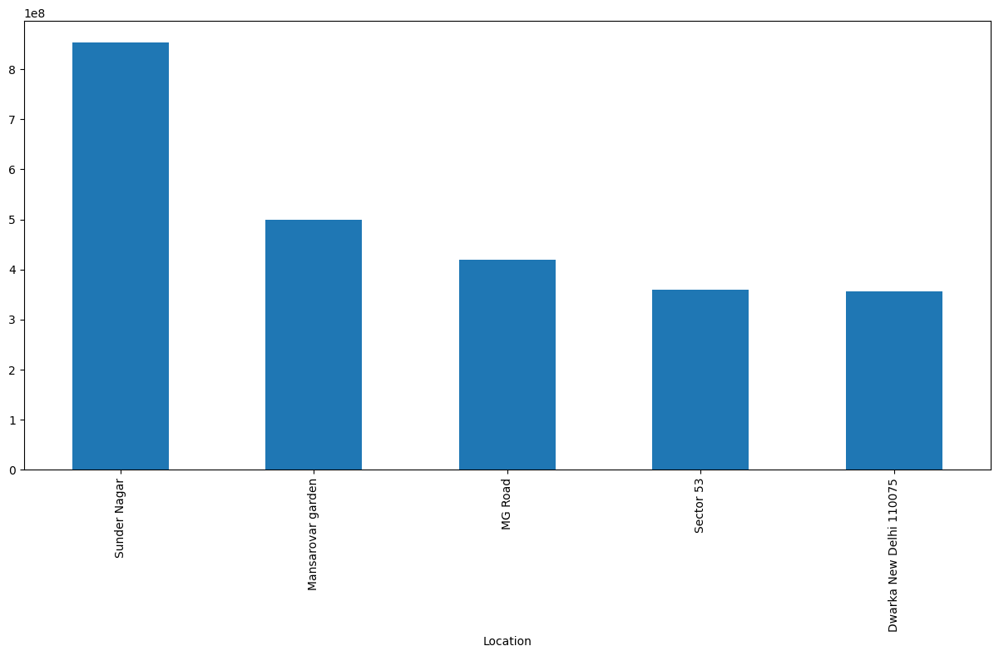

In [49]:
barplotWith5MostExpensiveAreas(india)
plt.show()

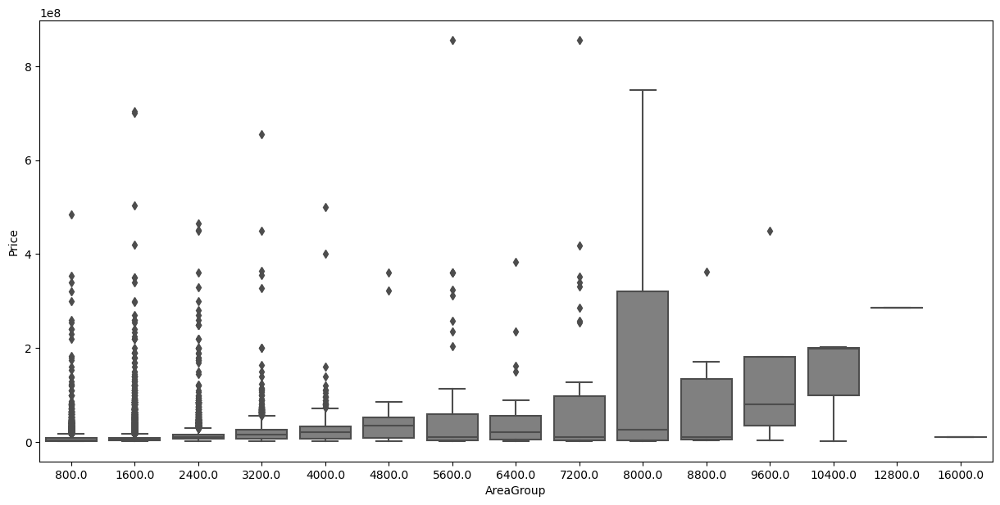

In [50]:
box(india)
plt.show()

## 8.4 Comments & Conclusions

India dataset consists of 32963 rows and 41 columns. There are 22870 NaN values (marked as '9') for every column apart from *Price*, *Area*, *Location*, *No. of Bedrooms* and *Resale*. For continuous variables such as *Price*, *Area* and *Location* there are 4924, 2452 and 1776 unique records. We have also checked Cramer V correlation between our variables (firstly we have grouped *Price* and *Area* into categories and created *PriceGroup* and *AreaGroup* variables) and searched for strong correlations (>0.75) so we could drop redundant columns. There is of course a really strong correlation (nearly 1.00) between *Location* and *City* - but it is no surprise as every city has generally its unique district names. Of course in our analysis we want to concentrate mainly on price so we have checked correlations for *PriceGroup*. Above, we can notice that there aren't really any strong correlations. Finally, we have checked some most important variable distributions and interesting relations between columns. Here are our conclusions:
1. Top property locations in India are *Noida* (Delhi), *New Town* (Kolkata) and *Khargar* (Mumbai). It's worth noticing that *Noida* is a whole city (in our dataset Delhi is a union territory), so that's probably why it has the biggest number of properties comparing to other locations which are mainly just districts.
2. The most common size of the property is about 1600 sq feet (150 sq metres). 
3. Most of the properties in India have 24/7 security.
4. The biggest (and generally most expensive) properties are far from public facilities like shopping mall or hospital (as they are probably located on the suburbs, where plots are bigger).
5. The majority of properties have no gas connection.
6. Indias's most expensive areas are *Sunder Nagar* and *Marsarovar garden* (both in Delhi) and *MG Road* (Mumbai). The leader is Sunder Nagar with average house prices over 800000000.0 INR (10M EUR!). This small city is called the ultimate address of the uber-rich in Delhi.


## 9. Summary

To sum up, in our EDA we analysed 6 different dataframes describing house listings in Indian cities - *Bangalore*, *Chennai*, *Delhi*, *Kolkata*, *Hyderabad* and *Mumbai*. We checked overall information about these sets, such as size, number of missing values, unique columns etc. Then we created a correlation plot for each set to see if we could drop some redundant columns. There seem to be some really strong correlactions that we should include while doing data preprocessing and quite a lot of NaN values. On the other hand, the majority of columns is of numeric type so it will be convinient for further analysis. Another advantage is a good balance between the number of rows and columns. Overall, India dataset seems to be promising for our model creating.